# MNIST 

### Import packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import torch
import tensorflow as tf
from tensorflow import keras
from keras import layers
from sklearn.model_selection import train_test_split 
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import umap
import plotly.graph_objects as go

### Visualisation functions

In [2]:
labels = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

colors = [
    "#8dd3c7",  # Soft Aqua/Teal
    "#ffffb3",  # Pale Yellow
    "#bebada",  # Light Lavender
    "#fb8072",  # Coral Pink
    "#80b1d3",  # Soft Blue
    "#fdb462",  # Light Orange
    "#b3de69",  # Soft Green
    "#fccde5",  # Light Pink
    "#d9d9d9",  # Light Gray
    "#bc80bd"   # Soft Purple
]

In [3]:
def single_graph(data, by, d, title=None, digits=False):
    
    fig = plt.figure()

    if d==2: 
        ax = fig.add_subplot(1, 1, 1)
        graph_2d(ax=ax, data=data, title=title, by=by, digits=digits)
        
    elif d==3:
        ax = fig.add_subplot(111, projection='3d')
        graph_3d(ax=ax, data=data, title=title, by=by, digits=digits)

    plt.show()

In [4]:
def graph_2d(ax, data, title, by, digits=False):
    
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    ax.set_title(title)

    x_min, x_max = data['component 1'].min(), data['component 1'].max()
    y_min, y_max = data['component 2'].min(), data['component 2'].max()
    
    x_margin = (x_max - x_min) * 0.1
    y_margin = (y_max - y_min) * 0.1
    
    ax.set_xlim(x_min - x_margin, x_max + x_margin)
    ax.set_ylim(y_min - y_margin, y_max + y_margin)

    for label, color in zip(labels, colors):
        subset = data[data[by] == label]
        if digits:
            for i in range(len(subset)):
                ax.text(subset.iloc[i]['component 1'], subset.iloc[i]['component 2'],
                        str(label), color=color)
        else: 
            ax.scatter(subset['component 1'], subset['component 2'], c = color)

    if digits==False: ax.legend(labels, loc='best')

In [5]:
def graph_3d(ax, data, title, by, xlim, ylim, zlim, digits=False):
    
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    ax.set_zlabel('Component 3')
    ax.set_title(title)

    x_min, x_max = data['component 1'].min(), data['component 1'].max()
    y_min, y_max = data['component 2'].min(), data['component 2'].max()
    z_min, z_max = data['component 3'].min(), data['component 3'].max()

    if xlim==None:
        x_margin = (x_max - x_min) * 0.1
        ax.set_xlim(x_min - x_margin, x_max + x_margin)
    else:
        ax.set_xlim(xlim)

    if ylim==None:
        y_margin = (y_max - y_min) * 0.1
        ax.set_ylim(y_min - y_margin, y_max + y_margin)
    else: 
        ax.set_ylim(ylim)

    if zlim==None:
        z_margin = (z_max - z_min) * 0.1
        ax.set_zlim(z_min - z_margin, z_max + z_margin)
    else:
        ax.set_zlim(zlim)
    
    for label, color in zip(labels, colors):
        subset = data[(data[by] == label) & (data["match"]) ]
        
        if digits:
            for i in range(len(subset)):
                ax.text(subset.iloc[i]['component 1'], subset.iloc[i]['component 2'], subset.iloc[i]['component 3'],
                        str(label), c=color)
        else:
             ax.scatter(subset['component 1'], subset['component 2'], subset['component 3'], c = color)
    
    if digits==False: ax.legend(labels, loc='best')

In [6]:
def plot_panel(data_list, global_title, titles, by, d, rows, cols, xlim=None, ylim=None, zlim=None, digits=False):
    
    if d==2:
        fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
        
        if rows * cols > 1:
            axs = axs.flatten()
        else:
            axs = [axs]
    
        for ax, data, title in zip(axs, data_list, titles):
            graph_2d(ax, data, title, by, digits)

    elif d==3:
        fig = plt.figure(figsize=(5 * cols, 5 * rows))
        axs = []
        for i in range(1, rows * cols + 1):
            ax = fig.add_subplot(rows, cols, i, projection='3d')
            axs.append(ax)
    
        for ax, data, title in zip(axs, data_list, titles):
            graph_3d(ax, data, title, by, xlim, ylim, zlim, digits)
        
    
    for ax in axs[len(data_list):]:
            ax.set_visible(False)

    fig.suptitle(global_title, fontsize=20)
    plt.tight_layout()
    plt.show()

## Dataset

### Import dataset

    
The dataset is loaded from [openml.org repository](https://openml.org/search?type=data&status=active&id=554).

For introduction to the dataset and DL, see ['Chapter 1. But what is a Neural Network?'](https://www.3blue1brown.com/lessons/neural-networks) from 3blue1brown.

In [7]:
from sklearn.datasets import fetch_openml

def downloadMNIST(n_train=60000, n_test = 10000):
    
    X, y = fetch_openml('mnist_784', version=1, return_X_y=True, as_frame=False)
    
    train_idx = np.arange(0, n_train)
    test_idx = np.arange(n_train, n_train + n_test)
    
    x_train, y_train = pd.DataFrame(X[train_idx]), pd.DataFrame(y[train_idx])
    x_test, y_test = pd.DataFrame(X[test_idx]), pd.DataFrame(y[test_idx]) 

    y_train = y_train.squeeze()
    y_test = y_test.squeeze()
    
    y_test =  y_test.astype(int)
    y_train =  y_train.astype(int)

    x_test = x_test / 255
    x_train = x_train / 255

    return (x_train, y_train, x_test, y_test)

x_train, y_train, x_test, y_test= downloadMNIST()

x = pd.concat([x_train, x_test], axis=0, ignore_index=True)
y = pd.concat([y_train, y_test], axis=0, ignore_index=True)

### Dataset description
The MNIST dataset provides 70,000 images of handwritten digits. Digits are centred in 28*28 pixels square and written in black and white. The dataset consists of:

- 784 features - the greyscale value for each pixel
- a categorical label - 0 to 9 for the digit illustrated

In [8]:
def plot_random_digit(x_data, y_data): 

    i = random.sample(range(len(x_data)), 1)
    
    fig= plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111)
    sample_image = x_data.iloc[i].values.reshape(28, 28)

    plt.imshow(sample_image, cmap='gray')

    width, height = sample_image.shape
    thresh = sample_image.max()/2.5
    for x in range(width):
        for y in range(height):
            ax.annotate(str(round(sample_image[x][y],1)), xy=(y,x),
                        horizontalalignment='center',
                        verticalalignment='center',
                        fontsize=6,
                        color='white' if sample_image[x][y]<thresh else 'black')


    plt.title(f'Label: {y_data.loc[i].values}', fontsize=10)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

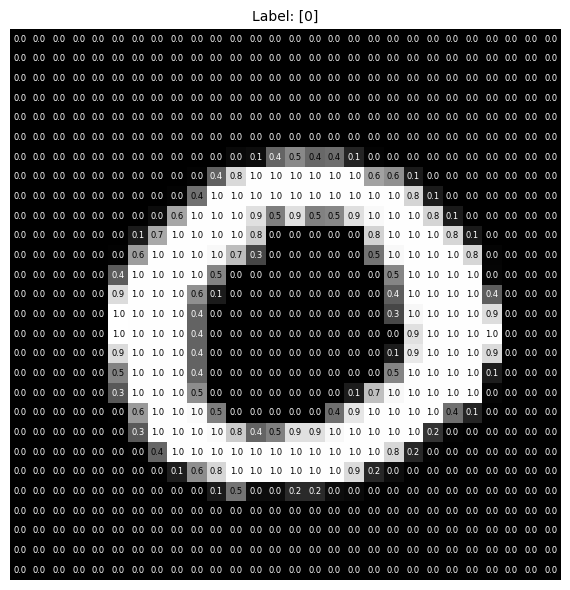

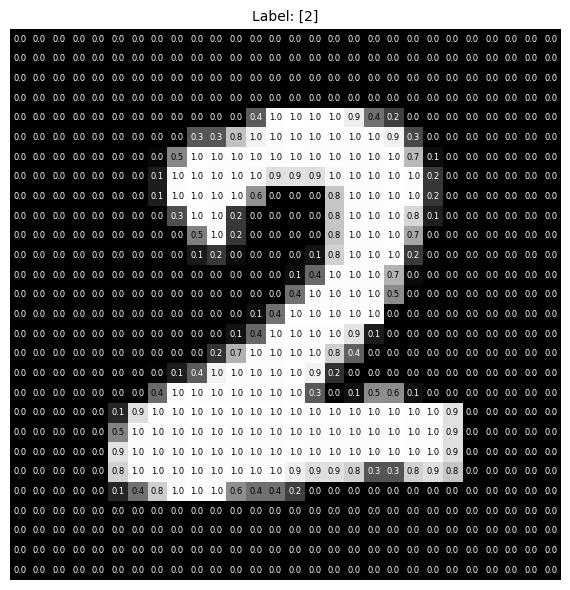

In [9]:
#| layout-ncol: 2
plot_random_digit(x, y)
plot_random_digit(x, y)

In [10]:
def plot_random_digits(x_data, y_data, x=1, y=1, labels=True): 

    random_indices = random.sample(range(len(x_data)), x*y)
    
    plt.figure(figsize=(10, 5))
    
    for i, idx in enumerate(random_indices):
        sample_image = x_data.iloc[idx].values.reshape(28, 28)
    
        plt.subplot(x, y, i + 1)
        plt.imshow(sample_image, cmap='gray')
        if labels: plt.title(f'Label: {y_data.iloc[idx]}', fontsize=10)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

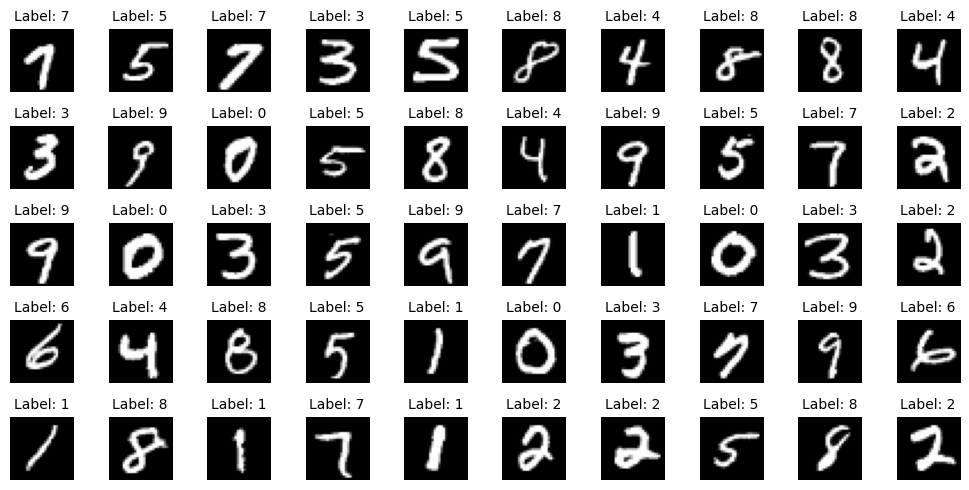

In [11]:
plot_random_digits(x, y, x=5, y=10, labels=True)

### Subset for data visualisation

In [12]:
def hist_label_frequency(dataset):
    plt.figure(figsize=(6, 4))
    counts, bins, patches = plt.hist(dataset, color='white', edgecolor='black')
    for i, patch in enumerate(patches):
        patch.set_facecolor(colors[i])
    plt.xlabel('Label')
    plt.ylabel('Frequency')
    plt.axhline(np.mean(counts), color='black', linestyle='dashed')
    plt.title(f'Dataset of first {dataset.shape[0]} digits')
    plt.show()

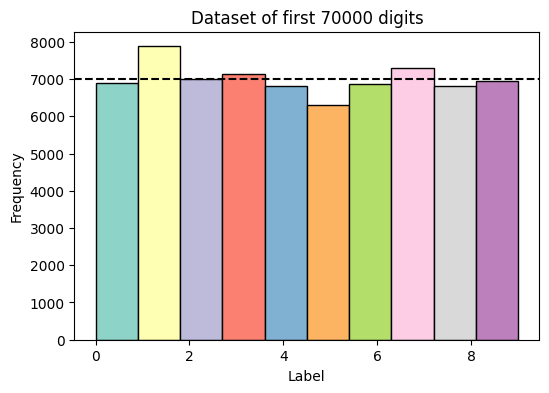

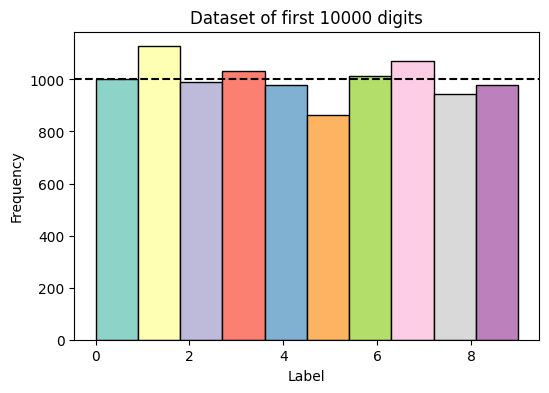

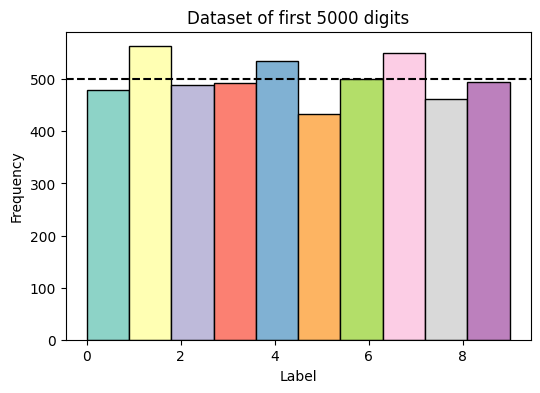

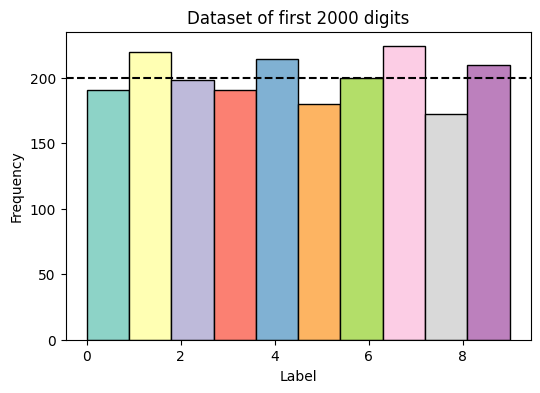

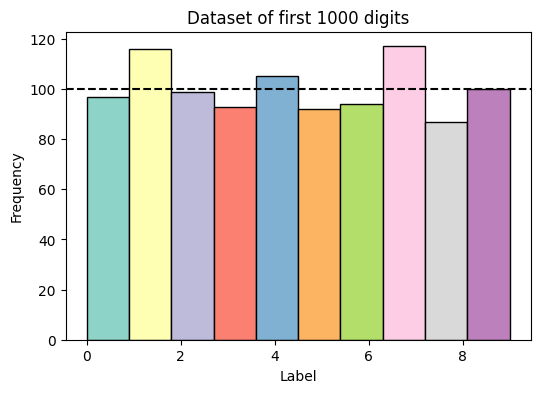

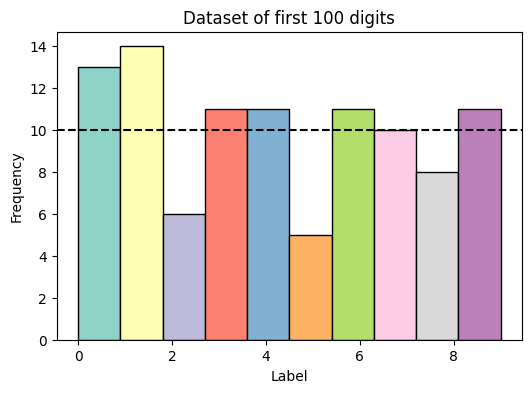

In [13]:
#| layout-ncol: 3

hist_label_frequency(y)
hist_label_frequency(y[:10000])
hist_label_frequency(y[:5000])
hist_label_frequency(y[:2000])
hist_label_frequency(y[:1000])
hist_label_frequency(y[:100])

The distribution of digits in a subset of first 2000 pictures seems to be similar to that of a full dataset, hence this subset will be used for all further visualisations:

In [14]:
y_subset=y[:2000]
x_subset=x[:2000]

## Models

### MLP

**Multilayer perceptron (MLP)** is a feedforward, fully-connected artificial neuronal network with non-linear activation function (e.g. relu or softmax).

For the MNIST dataset classification problem, MLP input layer is always consists of 784 units and the output of 10 units and Softmax activation, where model prediction is the index of largest of 10 probabilities. The number and size of intermediate layers is flexible and is given by a list of intergers - `widthes`. In `train_mlp` function, the model is trained on a full dataset (n=70000) and the final weights are saved in keras format. In `get_mlp` function, model and its performance and architecture metrics are extacted from saved keras file.

In [15]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.layers import Dense,Flatten
from keras.models import Model
from tensorflow.keras.layers import Input
import numpy as np
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.callbacks import EarlyStopping


def train_mlp(widthes, model_name):

    i = range(len(widthes))
    inputs = Input(shape=(784,), name='input')
    x = Dense(widthes[0], activation='relu', name='dense_1')(inputs)
    for width, i in zip(widthes[1:], i):
        x = Dense(width, activation='relu', name=f'dense_{i+2}')(x)   
    outputs = Dense(10, activation='softmax', name='output')(x)
    
    model = Model(inputs=inputs, outputs=outputs, name=model_name)
    
    model.compile(loss='sparse_categorical_crossentropy',
                  optimizer='Adam',
                  metrics=['accuracy'])

    early_stopping = EarlyStopping(monitor='val_loss', patience=5,
                                   restore_best_weights=True)
    history = model.fit(x_train, y_train,
                        epochs=100, validation_split=0.2,
                        callbacks=[early_stopping])

    y_pred = np.argmax(model.predict(x_test), axis=1)
    
    model.save(f"{model_name}.keras")
    
    graph_model_accuracy(history)
    graph_model_loss(history)
    

In [24]:
def get_mlp(model_name):
    
    model = keras.models.load_model(f"{model_name}.keras")

    test_loss, test_acc = model.evaluate(x_test, y_test)

    model.layers[0].units = 784

    layers_names=[layer.name for layer in model.layers]
    layers_widthes=[layer.units for layer in model.layers]
    
    return model, layers_names, layers_widthes, test_loss, test_acc

In [25]:
def graph_model_accuracy(history):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation',], loc='upper left')
    plt.show()

def graph_model_loss(history):
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation',], loc='upper right')
    plt.show()

For visualisation of effect of MLP width and depth on internal representations of MNIST dataset:

+ The same data is used across all models (`y_subset` and `x_subset`)
+ All MLP models consist of:
  - input layer of 784 units
  - several dense layers, followed by Relu activation function
  - output layer of 10 units, followed by Softmax activation
+ Hyperparameters were kept constant across models:
  - number of epochs - 100
  - loss - sparse_categorical_crossentropy
  - optimizer - Adam
  - metrics - accuracy
  - early stopping on val_loss with patience 5
  - validation_split - 0.2
+ No hyperparameter tuning was performed

### Other models

Alternatively, more complex models can be used, for example convolutional neuronal networks (CNN) and ResNet (e.g. [see)](https://huggingface.co/docs/transformers/model_doc/resnet)

## Extract internal activations

In [108]:
from keras.models import Model

def get_activations(model, x_data, y_data):

    intermediate_models = [Model(inputs=model.input, outputs=model.layers[i].output) for i in range(len(model.layers))]


    data = {
    'activations': [intermediate_model.predict(x_data) for intermediate_model in intermediate_models],
    'targets': y_data
    }

    data['predictions']= pd.Series(np.argmax(data['activations'][len(model.layers)-1], axis=(1)))

    data['match'] = data['targets'] == data['predictions']

    return data

Alternatively, look into [THINGSvision](https://www.frontiersin.org/journals/neuroinformatics/articles/10.3389/fninf.2021.679838/full).

## Dimensionality reduction


In deep learning, data is transmitted within the model in a form of high-dimensional vectors and matrixes, whereas humans have diffuculty understanding high-dimensionality. Dimensionality reduction techniques help to transform vectors from high dimensional space to a lower dimensional, while still preserving some 'meaning'.

All simplification of data involves some loss of accuracy of information. And the interpretation of dimensionality reduction methods and low-dimensional plots is the key challenge of my internship and requires further investigation.

::: {.panel-tabset .nav-pills}

### PCA

**Prinicipal Component Analysis** (PCA) is a linear dimensionality reduction method. It constracts principal components, which are linear combinations of the intial variables (or geometrically speaking, the directions of the data that explains the maximal amount of variance, like new axes for your data), so that they are uncorrelated and largest possible variance is in the first principal components. Later components that carry less information, can be discarded and only the first three plotted.


**Resources on PCA:**

For introduction to PCA and explanation of its procedure, see *Principal Component Analysis (PCA): A Step-by-Step Explanation* by  Zakaria Jaadi [(link)](https://builtin.com/data-science/step-step-explanation-principal-component-analysis#:~:text=Principal%20component%20analysis%2C%20or%20PCA,information%20in%20the%20large%20set.) .

[A Review of Principal Component Analysis Algorithm for Dimensionality Reduction](https://publisher.uthm.edu.my/ojs/index.php/jscdm/article/view/8032)



### T-SNE

**t-SNE** (t-distributed Stochastic Neighbor Embedding) is a nonlinear dimensionality reduction technique that transforms high-dimensional data into a lower-dimensional space while preserving the local structure of the data. It works by first converting the high-dimensional Euclidean distances between data points into conditional probabilities, which represent the similarity between points. In the lower-dimensional space, t-SNE aims to find a similar distribution of points by minimizing the Kullback-Leibler divergence between the high-dimensional and low-dimensional probability distributions. Unlike PCA, t-SNE focuses on preserving small pairwise distances (local relationships) rather than global structure, making it particularly useful for visualizing complex data, such as clusters or manifold structures.


**Resources on T-SNE:**

[How to Use t-SNE Effectively](https://distill.pub/2016/misread-tsne/)



### UMAP

**UMAP** (Uniform Manifold Approximation and Projection) is a nonlinear dimensionality reduction technique that, like t-SNE, is used for visualizing high-dimensional data in lower-dimensional spaces. UMAP works by constructing a graph of the data's local neighborhood structure in high-dimensional space and then optimizing a low-dimensional representation that preserves this structure. It relies on concepts from Riemannian geometry and algebraic topology to capture both local and global structures in the data. UMAP is particularly known for being faster than t-SNE, scaling better with larger datasets, and often preserving more of the global structure in the data.

**Resources on UMAP:**

[Understanding UMAP](https://pair-code.github.io/understanding-umap/)


[Beautiful UMAP - Tutorial on 100-Dimensional Data](https://www.kaggle.com/code/bextuychiev/beautiful-umap-tutorial-on-100-dimensional-data)

### Other methods

#### Variational autoencoder


[Malena's work](https://www.notion.so/Malena-s-Internship-Doc-autoencoders-latent-space-visualisations-and-exploring-dimensionality-redu-d18c7ffb6dac41e0967172be411888db?pvs=4)

[video introduction to variational autoencoder](https://youtu.be/9zKuYvjFFS8)

[Tutorial 1: Intro to Autoencoders](https://compneuro.neuromatch.io/tutorials/Bonus_Autoencoders/student/Bonus_Tutorial1.html)

#### Grand Tour
[Visualizing Neural Networks with the Grand Tour](https://distill.pub/2020/grand-tour/)

#### [ParaDime](https://onlinelibrary.wiley.com/doi/10.1111/cgf.14834)
:::

In [27]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

def perform_pca(data, layer, n_components):
    
    standard_outputs = StandardScaler().fit_transform(data['activations'][layer])
    
    pca = PCA(n_components=n_components)
    
    components = pca.fit_transform(standard_outputs)

    outputs=pd.DataFrame({
        'predictions': data['predictions'],
        'targets': data['targets'], 
        'match': data['match']
    })

    for n in range(n_components):
        outputs[f'component {n+1}']=components[:, n]

    
    return outputs, pca.explained_variance_ratio_

In [28]:
def pca_variance_table(explained_variance_list, layers_widthes, layers_names): 
    
    df=pd.DataFrame(explained_variance_list)
    df=round(df, 4)
    df.columns = ['Component 1', 'Component 2', 'Component 3']
    df.insert(0, 'Layer', layers_names)
    df.insert(1, 'Width', layers_widthes)
    
    print(df)

In [29]:
import umap

def perform_umap(data, layer, n_components):

    umap_setup= umap.UMAP(n_components=n_components, init='random')
    components = umap_setup.fit_transform(data['activations'][layer])
    
    outputs=pd.DataFrame({
        'predictions': data['predictions'],
        'targets': data['targets'],
        'match': data['match']
    })

    for n in range(n_components):
        outputs[f'component {n+1}']=components[:, n]

    return outputs

In [30]:
from sklearn.manifold import TSNE

def perform_tsne(data, layer, n_components, perplexity=30, iteration=1000):
    
    output=pd.DataFrame({
            'predictions': data['predictions'],
            'targets': data['targets'], 
            'match': data['match'],
            'perplexity': perplexity,
            'iteration': iteration
    
    })
    
    tsne_setup = TSNE(n_components=n_components,
                      perplexity=perplexity,
                      max_iter=iteration)
    
    components = tsne_setup.fit_transform(data['activations'][layer])
    
    for n in range(n_components):
        output[f'component {n+1}']=components[:, n]

            
    return output

## Effect of MLP width and depth

**Question:**
How MLP width and depth affect the internal representations of the input?

**Steps:**
1. Create several MLP models with varying width (size of layers) and with varying depth (number of layers) leaving all other hyperparameters and preprocessing the same.
2. Check their performance
3. Extract activations from all layers for each model
4. Perform dimensionality reduction and plot components
5. Interpret the graph in regards on changes in internal representations of the input

### Models

#### Setting up

In [31]:
w1=[8, 4]
w2=[80, 40]
w3=[800, 400]
w4=[8000, 4000]

w5=[100]
w6=[100, 100]
w7=[100, 100, 100]
w8=[100, 100, 100, 100]

#### Training

In [23]:
train_mlp(w1, model_name='Model_1')
train_mlp(w2, model_name='Model_2')
train_mlp(w3, model_name='Model_3')
train_mlp(w4, model_name='Model_4')
train_mlp(w5, model_name='Model_5')
train_mlp(w6, model_name='Model_6')
train_mlp(w7, model_name='Model_7')
train_mlp(w8, model_name='Model_8')

Epoch 1/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 408us/step - accuracy: 0.4052 - loss: 1.6235 - val_accuracy: 0.8429 - val_loss: 0.5753
Epoch 2/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 356us/step - accuracy: 0.8492 - loss: 0.5526 - val_accuracy: 0.8826 - val_loss: 0.4297
Epoch 3/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 381us/step - accuracy: 0.8816 - loss: 0.4389 - val_accuracy: 0.8938 - val_loss: 0.3810
Epoch 4/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 381us/step - accuracy: 0.8930 - loss: 0.3905 - val_accuracy: 0.9031 - val_loss: 0.3527
Epoch 5/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 368us/step - accuracy: 0.9002 - loss: 0.3639 - val_accuracy: 0.9041 - val_loss: 0.3524
Epoch 6/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 366us/step - accuracy: 0.9021 - loss: 0.3454 - val_accuracy: 0.9097 - val_loss: 0.3343
Epoch 7/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 366us/step - accuracy: 0.9099 - loss: 0.3238 - val_accuracy: 0.9118 - val_loss: 0.3249
Epoch 8/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 364us/step - accuracy: 

NameError: name 'graph_model_accuracy' is not defined

#### Getting saved models

In [57]:
model1, layers_names1, layers_widthes1, test_loss1, test_acc1 = get_mlp('Model_1')
model2, layers_names2, layers_widthes2, test_loss2, test_acc2 = get_mlp('Model_2')
model3, layers_names3, layers_widthes3, test_loss3, test_acc3 = get_mlp('Model_3')
model4, layers_names4, layers_widthes4, test_loss4, test_acc4 = get_mlp('Model_4')
model5, layers_names5, layers_widthes5, test_loss5, test_acc5 = get_mlp('Model_5')
model6, layers_names6, layers_widthes6, test_loss6, test_acc6 = get_mlp('Model_6')
model7, layers_names7, layers_widthes7, test_loss7, test_acc7 = get_mlp('Model_7')
model8, layers_names8, layers_widthes8, test_loss8, test_acc8 = get_mlp('Model_8')

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - accuracy: 0.9086 - loss: 0.3480
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - accuracy: 0.9692 - loss: 0.1040
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - accuracy: 0.9710 - loss: 0.1104
313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.9706 - loss: 0.1170
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - accuracy: 0.9742 - loss: 0.0943
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - accuracy: 0.9734 - loss: 0.0938
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - accuracy: 0.9697 - loss: 0.1142
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - accuracy: 0.9673 - loss: 0.1271


#### Accuracy

In [58]:
print('Models accuracy on validation set:')
print(f'Model 1 - {round(test_acc1, 5)}')
print(f'Model 2 - {round(test_acc2, 5)}')
print(f'Model 3 - {round(test_acc3, 5)}')
print(f'Model 4 - {round(test_acc4, 5)}')
print(f'Model 5 - {round(test_acc5, 5)}')
print(f'Model 6 - {round(test_acc6, 5)}')
print(f'Model 7 - {round(test_acc7, 5)}')
print(f'Model 8 - {round(test_acc8, 5)}')

Models accuracy on validation set:
Model 1 - 0.9202
Model 2 - 0.9736
Model 3 - 0.9755
Model 4 - 0.9754
Model 5 - 0.9776
Model 6 - 0.9772
Model 7 - 0.9734
Model 8 - 0.9725


#### Model architecture

In [59]:
model1.summary()
model2.summary()
model3.summary()
model4.summary()
model5.summary()
model6.summary()
model7.summary()
model8.summary()

Model: "Model_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │         6,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │            36 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │            50 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,100 (74.61 KB)

 Trainable params: 6,366 (24.87 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,734 (49.75 KB)

Model: "Model_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 80)             │        62,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 40)             │         3,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │           410 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 199,352 (778.72 KB)

 Trainable params: 66,450 (259.57 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 132,902 (519.15 KB)

Model: "Model_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 800)            │       628,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 400)            │       320,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │         4,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,857,232 (10.90 MB)

 Trainable params: 952,410 (3.63 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,904,822 (7.27 MB)

Model: "Model_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8000)           │     6,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4000)           │    32,004,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │        40,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 114,972,032 (438.58 MB)

 Trainable params: 38,324,010 (146.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 76,648,022 (292.39 MB)

Model: "Model_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        78,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │         1,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 238,532 (931.77 KB)

 Trainable params: 79,510 (310.59 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 159,022 (621.18 KB)

Model: "Model_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        78,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │         1,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 268,832 (1.03 MB)

 Trainable params: 89,610 (350.04 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 179,222 (700.09 KB)

Model: "Model_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        78,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │         1,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 299,132 (1.14 MB)

 Trainable params: 99,710 (389.49 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 199,422 (779.00 KB)

Model: "Model_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        78,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │         1,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 329,432 (1.26 MB)

 Trainable params: 109,810 (428.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 219,622 (857.90 KB)

### Extracting activations

In [109]:
data1=get_activations(model1, x_subset, y_subset)
data2=get_activations(model2, x_subset, y_subset)
data3=get_activations(model3, x_subset, y_subset)
data4=get_activations(model4, x_subset, y_subset)
data5=get_activations(model5, x_subset, y_subset)
data6=get_activations(model6, x_subset, y_subset)
data7=get_activations(model7, x_subset, y_subset)
data8=get_activations(model8, x_subset, y_subset)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 221us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 205us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 506us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 670us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 207us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 207us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 566us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 206us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 498us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 208us/step
63/63 ━━━━━━━━━━━━━━

### PCA 

#### Low-dimensional plots

In [36]:
xlim = ylim = zlim = None

by='targets'

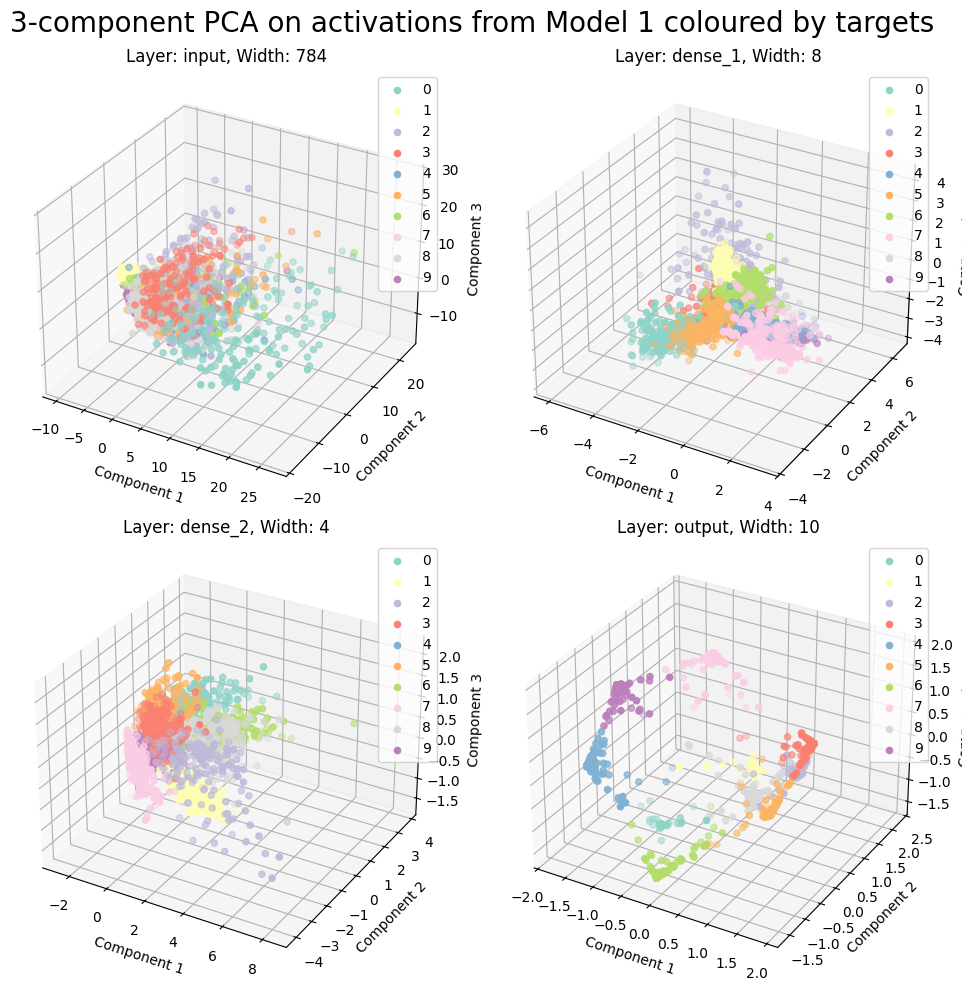

In [37]:
outputs1=[]
explained_variance1=[]
titles1=[]

for i in range(len(model1.layers)):
    output, explained_variance= perform_pca(data=data1, layer=i, n_components=3)
    outputs1.append(output)
    explained_variance1.append(explained_variance)
    titles1.append(f'Layer: {layers_names1[i]}, Width: {layers_widthes1[i]}')

plot_panel(data_list=outputs1,
           global_title=f'3-component PCA on activations from Model 1 coloured by {by}',
           titles=titles1, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

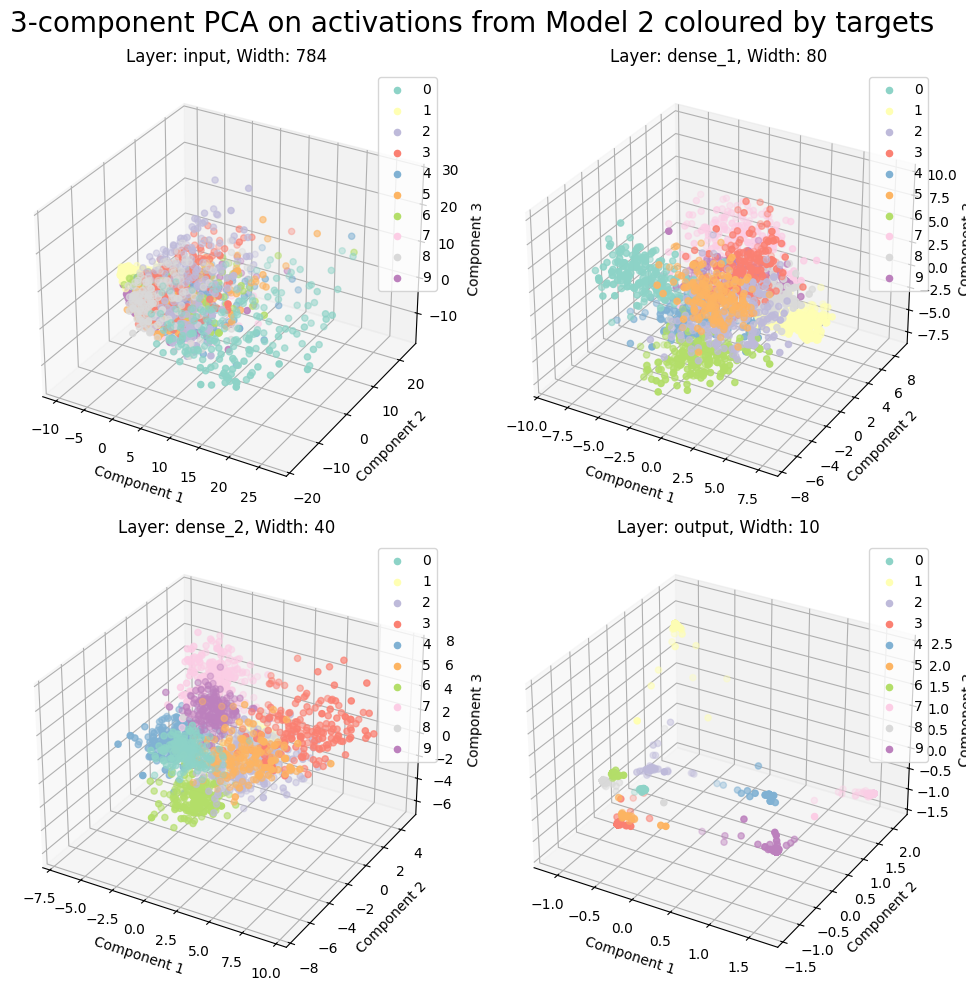

In [38]:
outputs2=[]
explained_variance2=[]
titles2=[]

for i in range(len(model2.layers)):
    output, explained_variance= perform_pca(data=data2, layer=i, n_components=3)
    outputs2.append(output)
    explained_variance2.append(explained_variance)
    titles2.append(f'Layer: {layers_names2[i]}, Width: {layers_widthes2[i]}')

plot_panel(data_list=outputs2,
           global_title=f'3-component PCA on activations from Model 2 coloured by {by}',
           titles=titles2, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

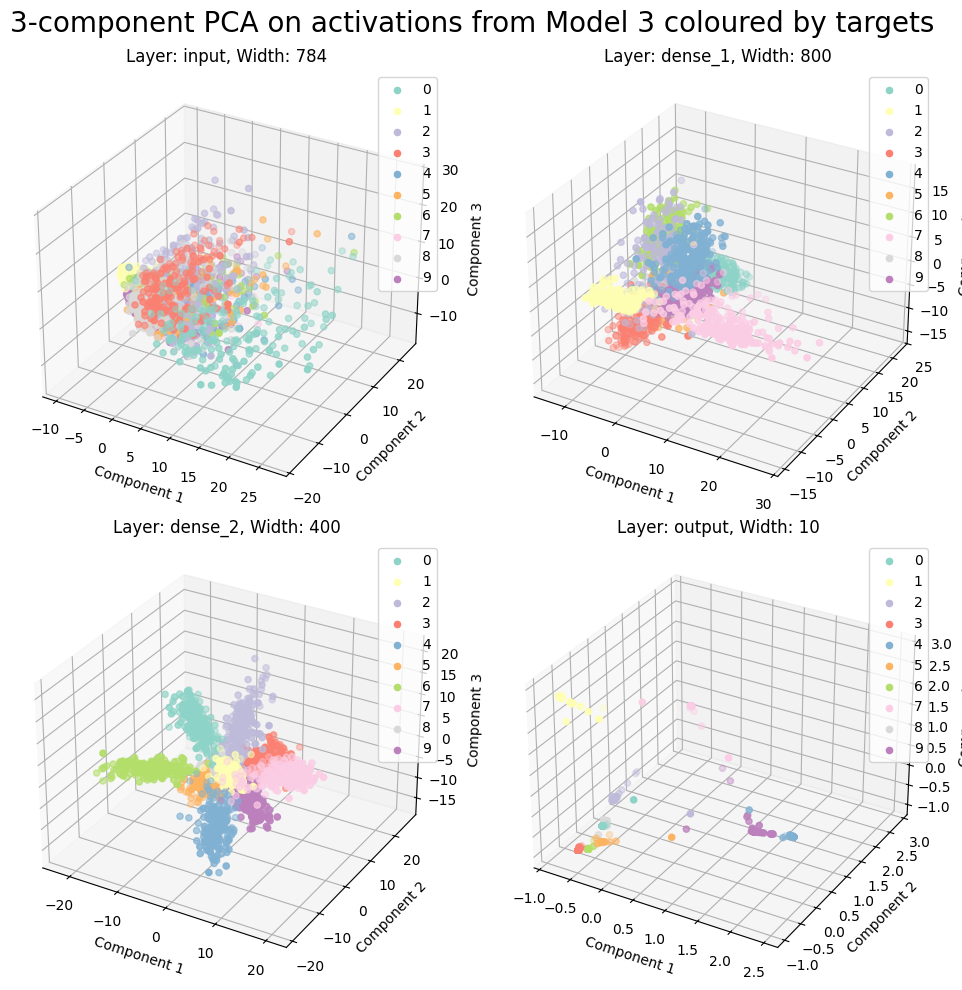

In [39]:
outputs3=[]
explained_variance3=[]
titles3=[]

for i in range(len(model3.layers)):
    output, explained_variance= perform_pca(data=data3, layer=i, n_components=3)
    outputs3.append(output)
    explained_variance3.append(explained_variance)
    titles3.append(f'Layer: {layers_names3[i]}, Width: {layers_widthes3[i]}')

plot_panel(data_list=outputs3,
           global_title=f'3-component PCA on activations from Model 3 coloured by {by}',
           titles=titles3, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

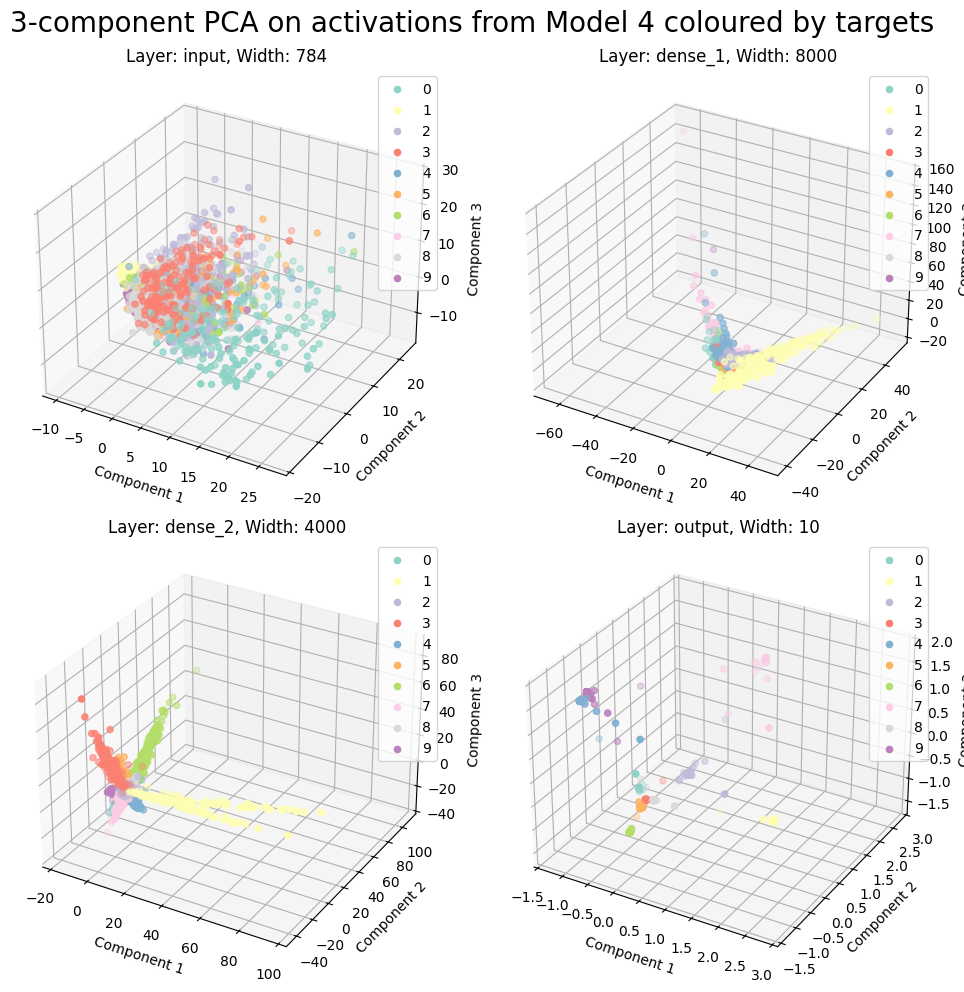

In [40]:
outputs4=[]
explained_variance4=[]
titles4=[]

for i in range(len(model4.layers)):
    output, explained_variance= perform_pca(data=data4, layer=i, n_components=3)
    outputs4.append(output)
    explained_variance4.append(explained_variance)
    titles4.append(f'Layer: {layers_names4[i]}, Width: {layers_widthes4[i]}')

plot_panel(data_list=outputs4,
           global_title=f'3-component PCA on activations from Model 4 coloured by {by}',
           titles=titles4, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

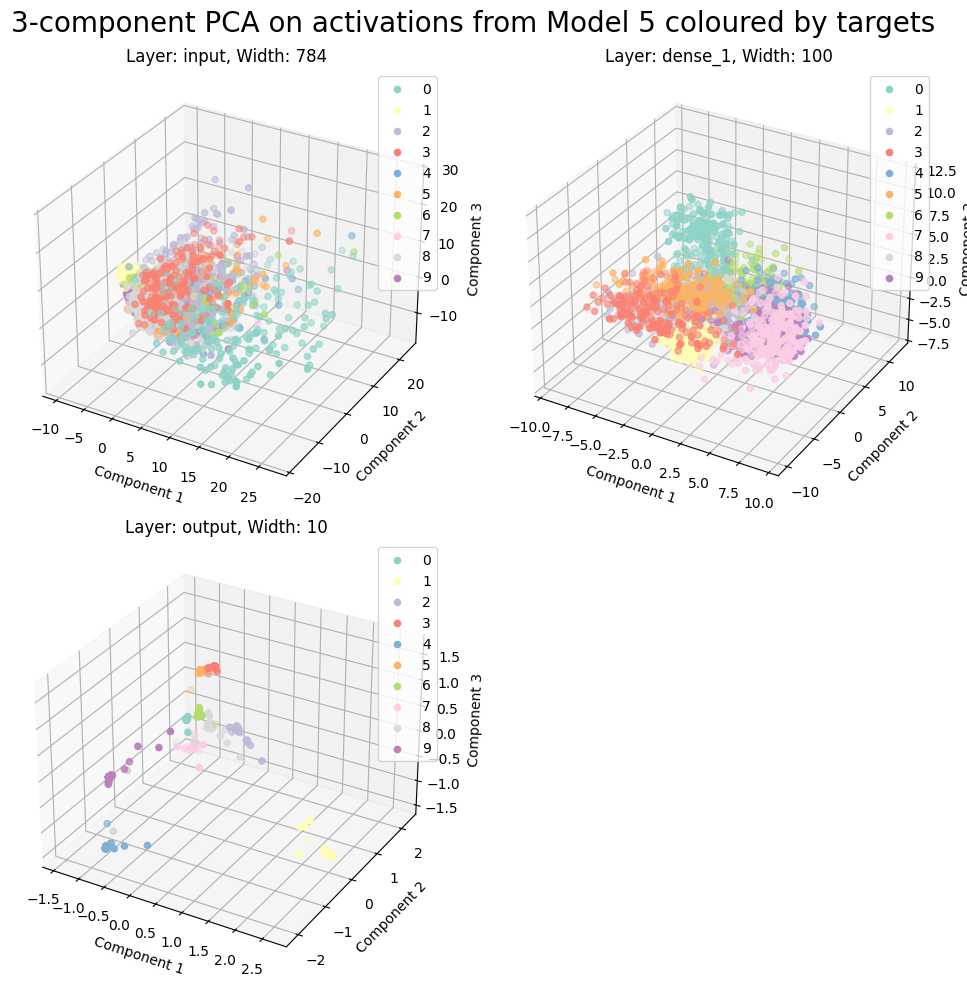

In [69]:
outputs5=[]
explained_variance5=[]
titles5=[]

for i in range(len(model5.layers)):
    output, explained_variance= perform_pca(data=data5, layer=i, n_components=3)
    outputs5.append(output)
    explained_variance5.append(explained_variance)
    titles5.append(f'Layer: {layers_names5[i]}, Width: {layers_widthes5[i]}')

plot_panel(data_list=outputs5,
           global_title=f'3-component PCA on activations from Model 5 coloured by {by}',
           titles=titles5, by=by, d=3,
           rows=2, cols=2)

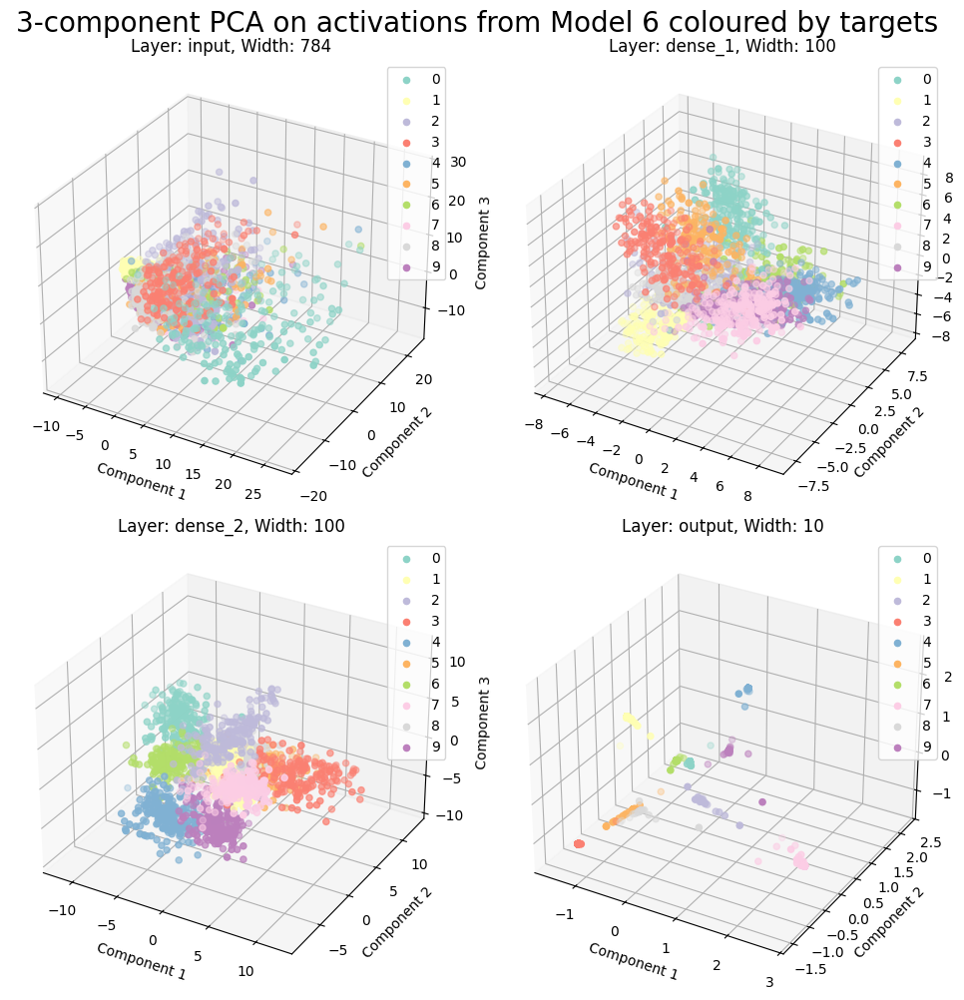

In [70]:
outputs6=[]
explained_variance6=[]
titles6=[]

for i in range(len(model6.layers)):
    output, explained_variance= perform_pca(data=data6, layer=i, n_components=3)
    outputs6.append(output)
    explained_variance6.append(explained_variance)
    titles6.append(f'Layer: {layers_names6[i]}, Width: {layers_widthes6[i]}')

plot_panel(data_list=outputs6,
           global_title=f'3-component PCA on activations from Model 6 coloured by {by}',
           titles=titles6, by=by, d=3,
           rows=3, cols=2)

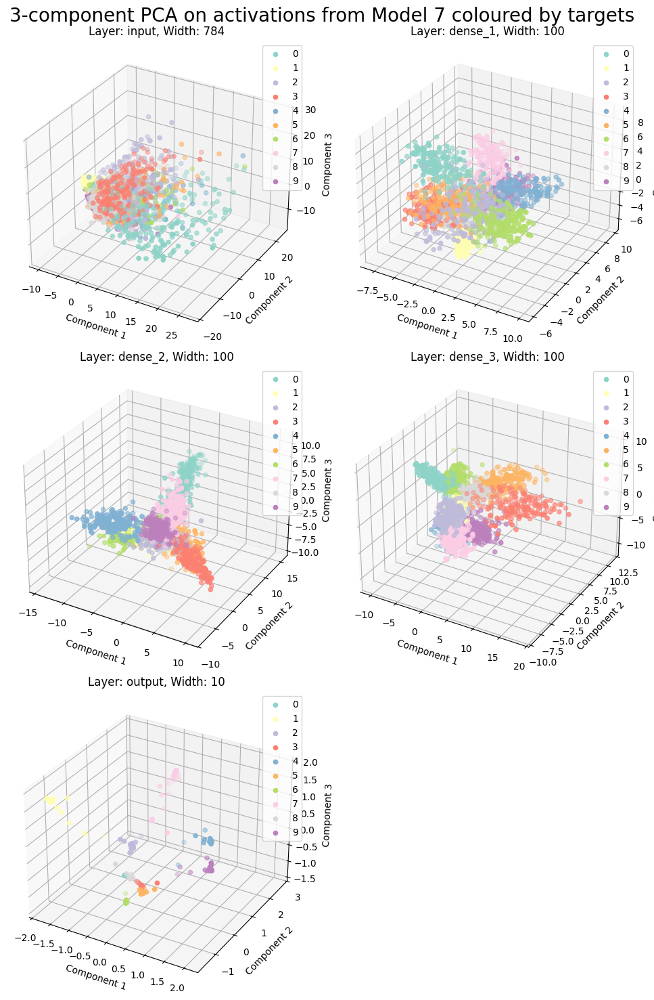

In [71]:
outputs7=[]
explained_variance7=[]
titles7=[]

for i in range(len(model7.layers)):
    output, explained_variance= perform_pca(data=data7, layer=i, n_components=3)
    outputs7.append(output)
    explained_variance7.append(explained_variance)
    titles7.append(f'Layer: {layers_names7[i]}, Width: {layers_widthes7[i]}')

plot_panel(data_list=outputs7,
           global_title=f'3-component PCA on activations from Model 7 coloured by {by}',
           titles=titles7, by=by, d=3,
           rows=3, cols=2)

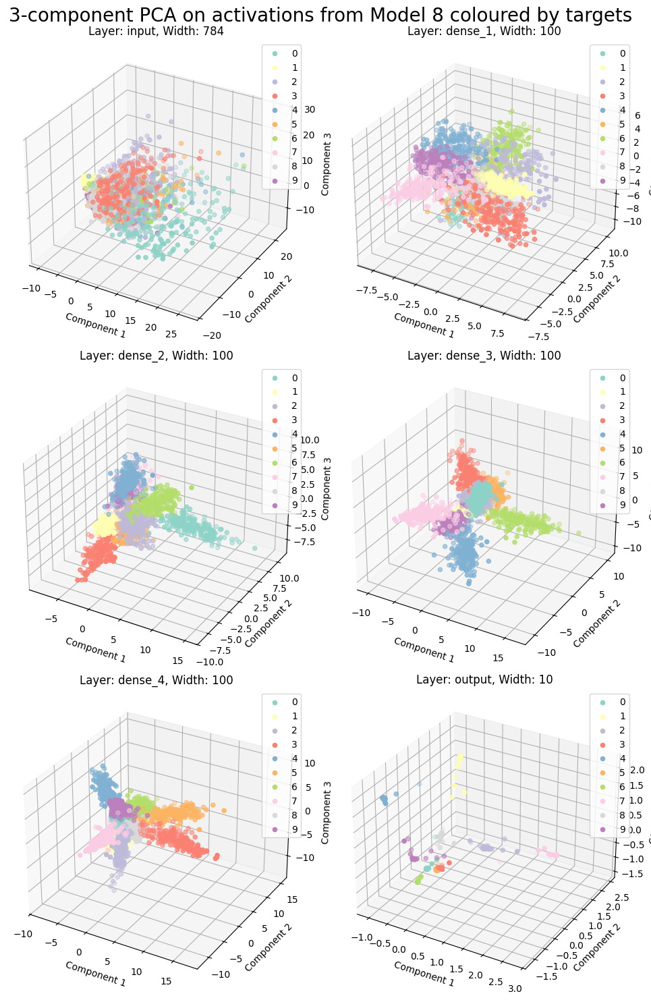

In [72]:
outputs8=[]
explained_variance8=[]
titles8=[]

for i in range(len(model8.layers)):
    output, explained_variance= perform_pca(data=data8, layer=i, n_components=3)
    outputs8.append(output)
    explained_variance8.append(explained_variance)
    titles8.append(f'Layer: {layers_names8[i]}, Width: {layers_widthes8[i]}')

plot_panel(data_list=outputs8,
           global_title=f'3-component PCA on activations from Model 8 coloured by {by}',
           titles=titles8, by=by, d=3,
           rows=3, cols=2)

#### Expained variance tables

In [73]:
print("\nModel 1")
pca_variance_table(explained_variance1, layers_widthes1, layers_names1)
print("\nModel 2")
pca_variance_table(explained_variance2, layers_widthes2, layers_names2)
print("\nModel 3")
pca_variance_table(explained_variance3, layers_widthes3, layers_names3)
print("\nModel 4")
pca_variance_table(explained_variance4, layers_widthes4, layers_names4)
print("\nModel 5")
pca_variance_table(explained_variance5, layers_widthes5, layers_names5)
print("\nModel 6")
pca_variance_table(explained_variance6, layers_widthes6, layers_names6)
print("\nModel 7")
pca_variance_table(explained_variance7, layers_widthes7, layers_names7)
print("\nModel 8")
pca_variance_table(explained_variance8, layers_widthes8, layers_names8)


Model 1
     Layer  Width  Component 1  Component 2  Component 3
0    input    784       0.0619       0.0491       0.0428
1  dense_1      8       0.2448       0.1863       0.1743
2  dense_2      4       0.5683       0.2654       0.1030
3   output     10       0.1223       0.1157       0.1153

Model 2
     Layer  Width  Component 1  Component 2  Component 3
0    input    784       0.0619       0.0491       0.0428
1  dense_1     80       0.1270       0.1171       0.1045
2  dense_2     40       0.1863       0.1375       0.1318
3   output     10       0.1132       0.1130       0.1124

Model 3
     Layer  Width  Component 1  Component 2  Component 3
0    input    784       0.0619       0.0491       0.0428
1  dense_1    800       0.0439       0.0395       0.0373
2  dense_2    400       0.1200       0.1105       0.0891
3   output     10       0.1142       0.1128       0.1122

Model 4
     Layer  Width  Component 1  Component 2  Component 3
0    input    784       0.0619       0.0491       0.

### UMAP

In [45]:
xlim = ylim = zlim = None

by='targets'

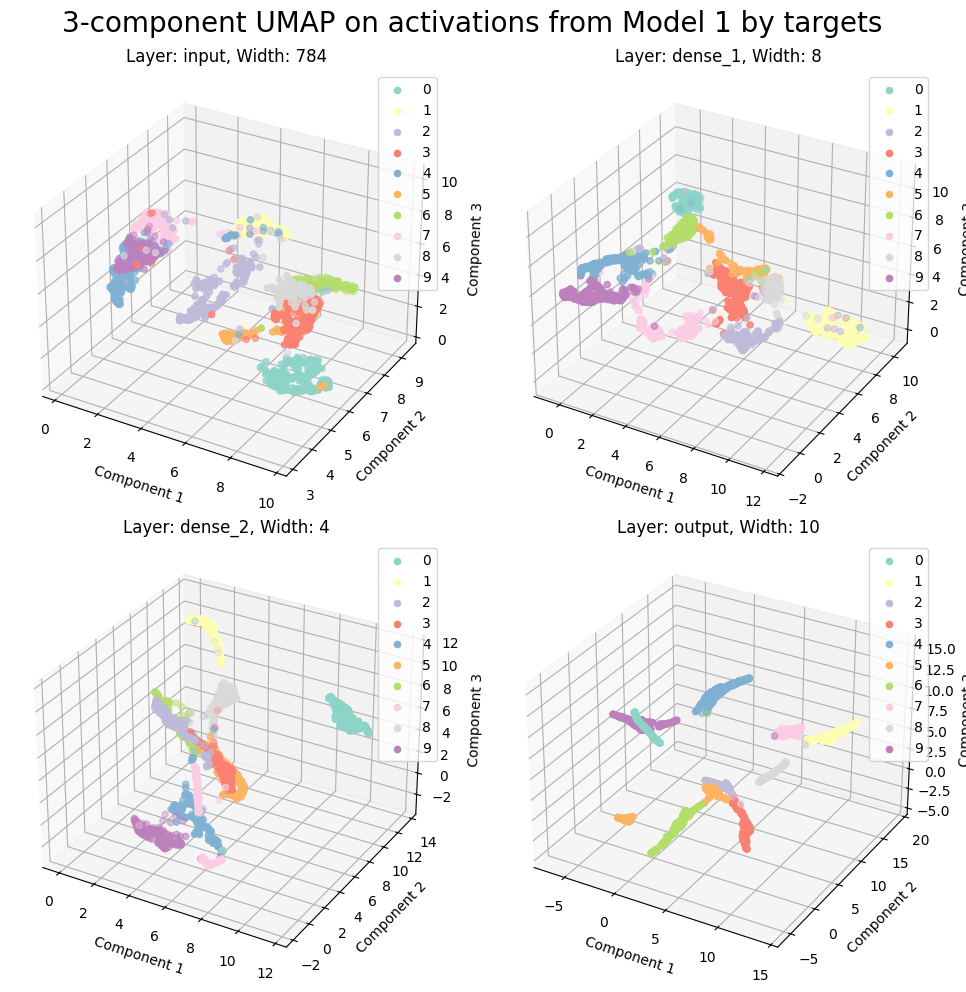

In [74]:
outputs=[]
titles=[]

for i in range(len(model1.layers)):
    output= perform_umap(data1, layer=i, n_components=3)
    outputs.append(output)
    titles.append(f'Layer: {layers_names1[i]}, Width: {layers_widthes1[i]}')

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 1 by {by}',
           titles=titles, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

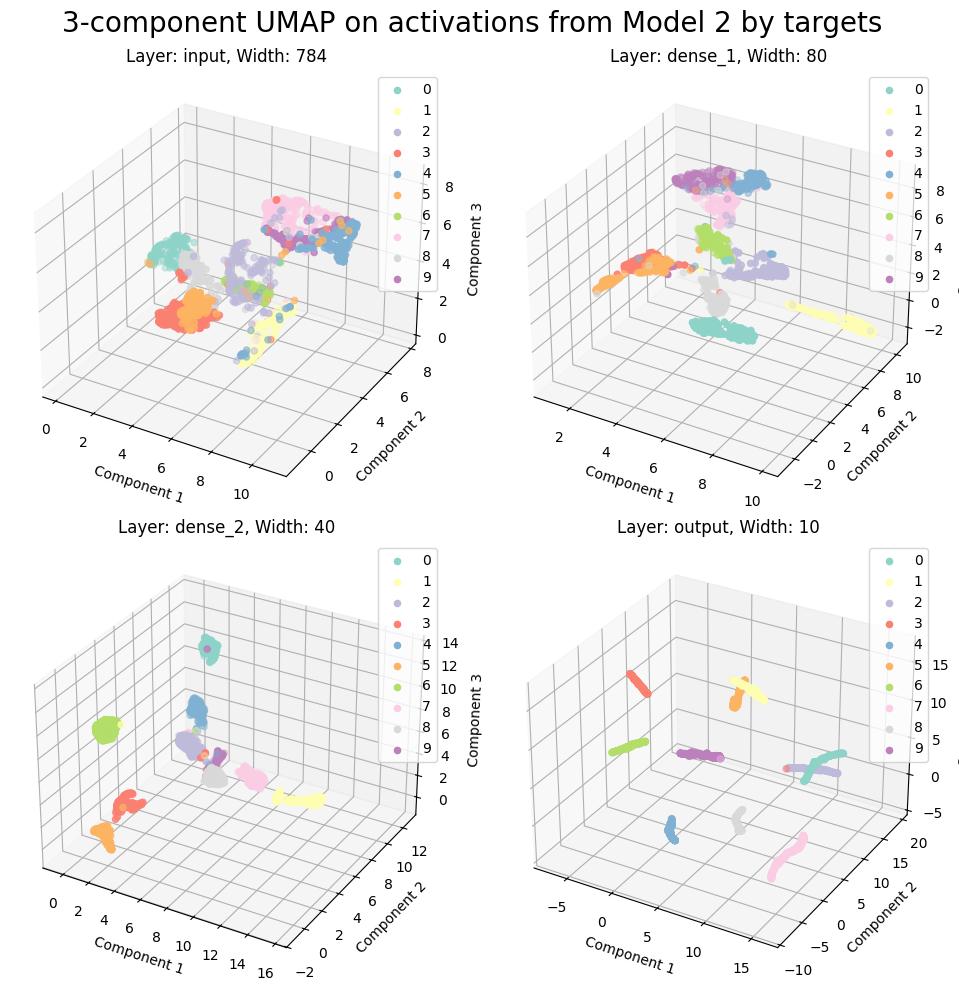

In [47]:
outputs=[]
titles=[]

for i in range(len(model2.layers)):
    output= perform_umap(data2, layer=i, n_components=3)
    outputs.append(output)
    titles.append(f'Layer: {layers_names2[i]}, Width: {layers_widthes2[i]}')

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 2 by {by}',
           titles=titles, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

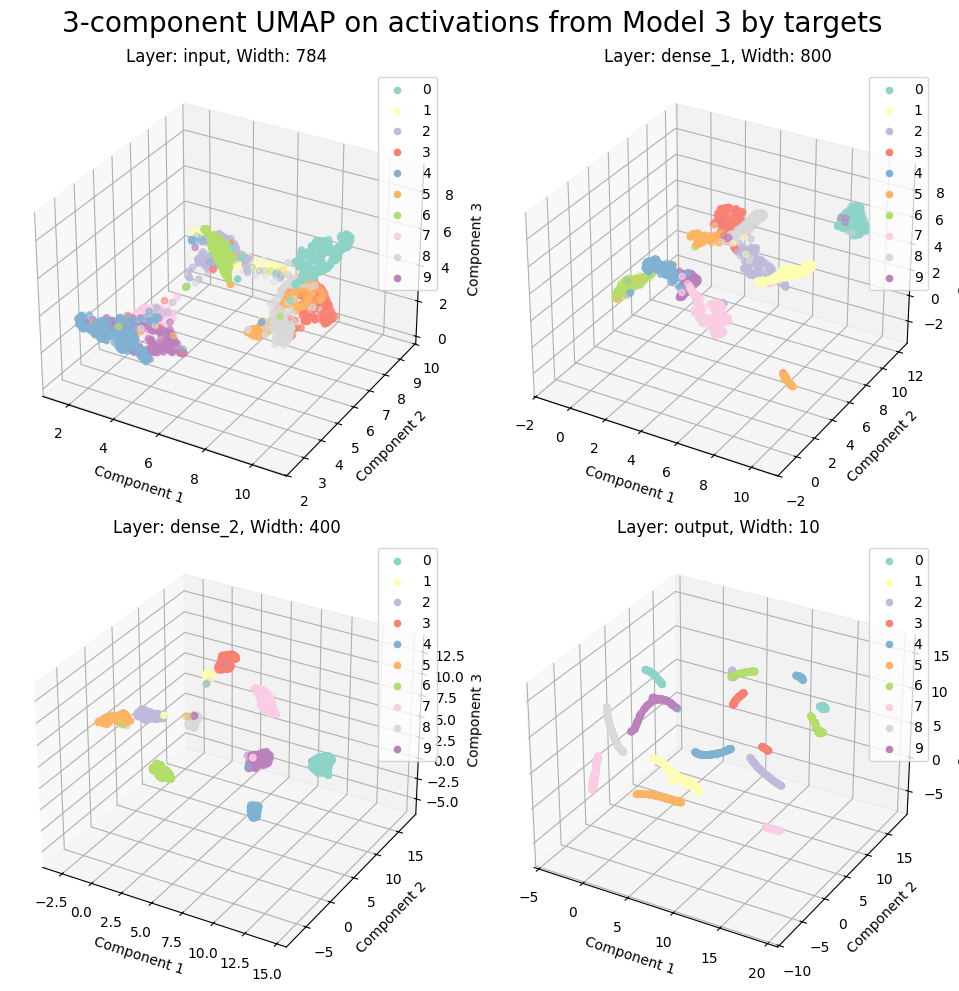

In [48]:
outputs=[]
titles=[]

for i in range(len(model3.layers)):
    output= perform_umap(data3, layer=i, n_components=3)
    outputs.append(output)
    titles.append(f'Layer: {layers_names3[i]}, Width: {layers_widthes3[i]}')

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 3 by {by}',
           titles=titles, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

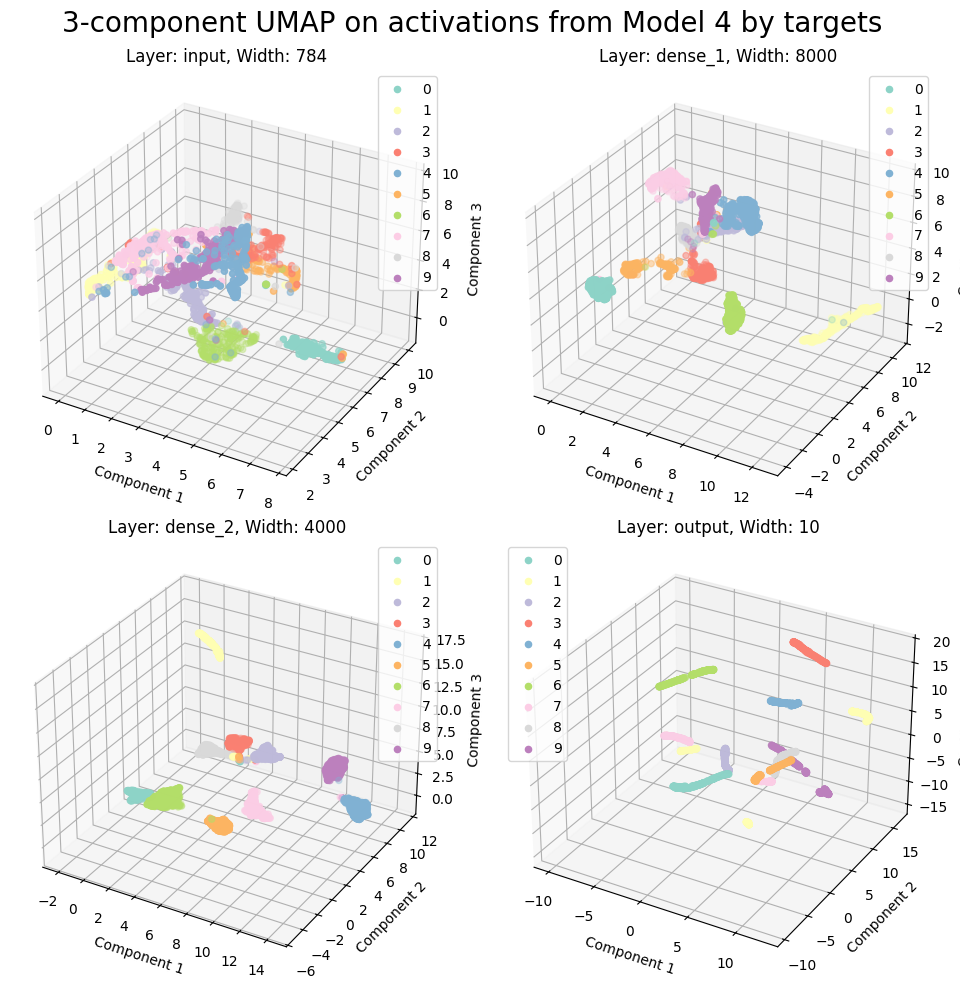

In [49]:
outputs=[]
titles=[]

for i in range(len(model4.layers)):
    output= perform_umap(data4, layer=i, n_components=3)
    outputs.append(output)
    titles.append(f'Layer: {layers_names4[i]}, Width: {layers_widthes4[i]}')

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 4 by {by}',
           titles=titles, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

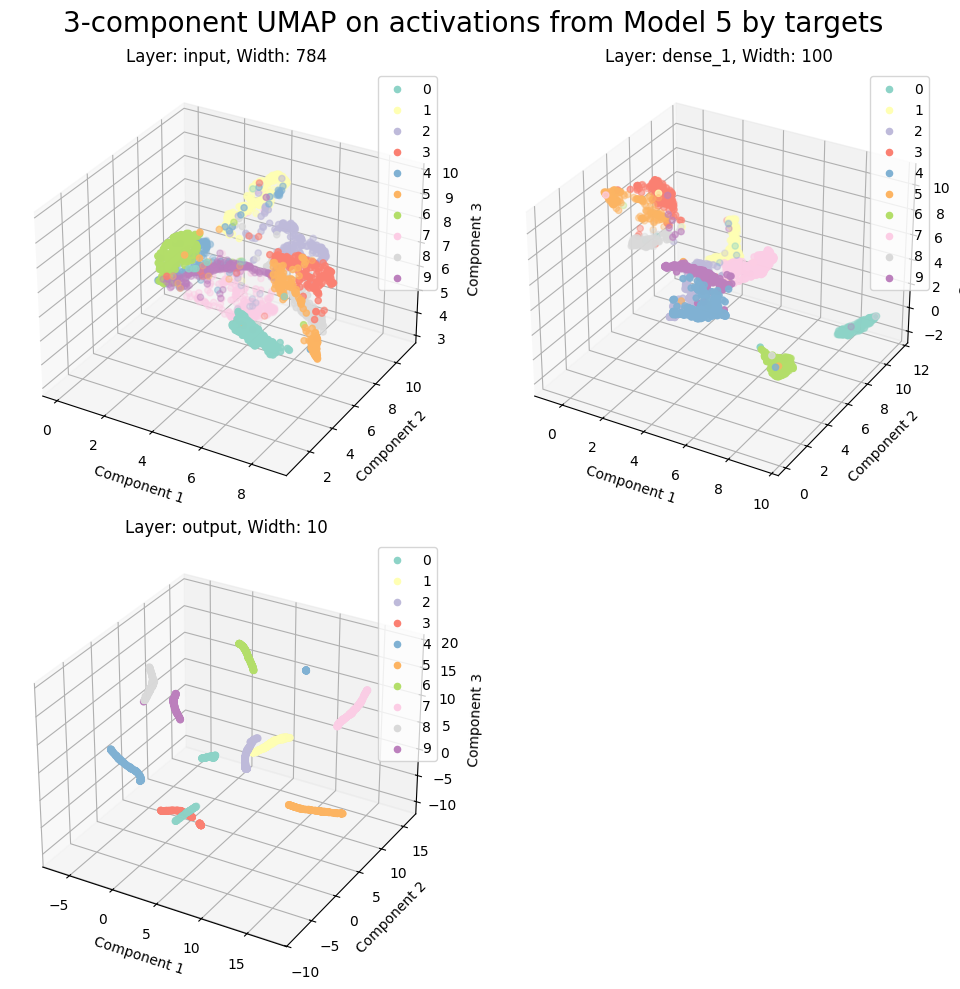

In [75]:
outputs=[]
titles=[]

for i in range(len(model5.layers)):
    output= perform_umap(data5, layer=i, n_components=3)
    outputs.append(output)
    titles.append(f'Layer: {layers_names5[i]}, Width: {layers_widthes5[i]}')

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 5 by {by}',
           titles=titles, by=by, d=3,
           rows=2, cols=2)

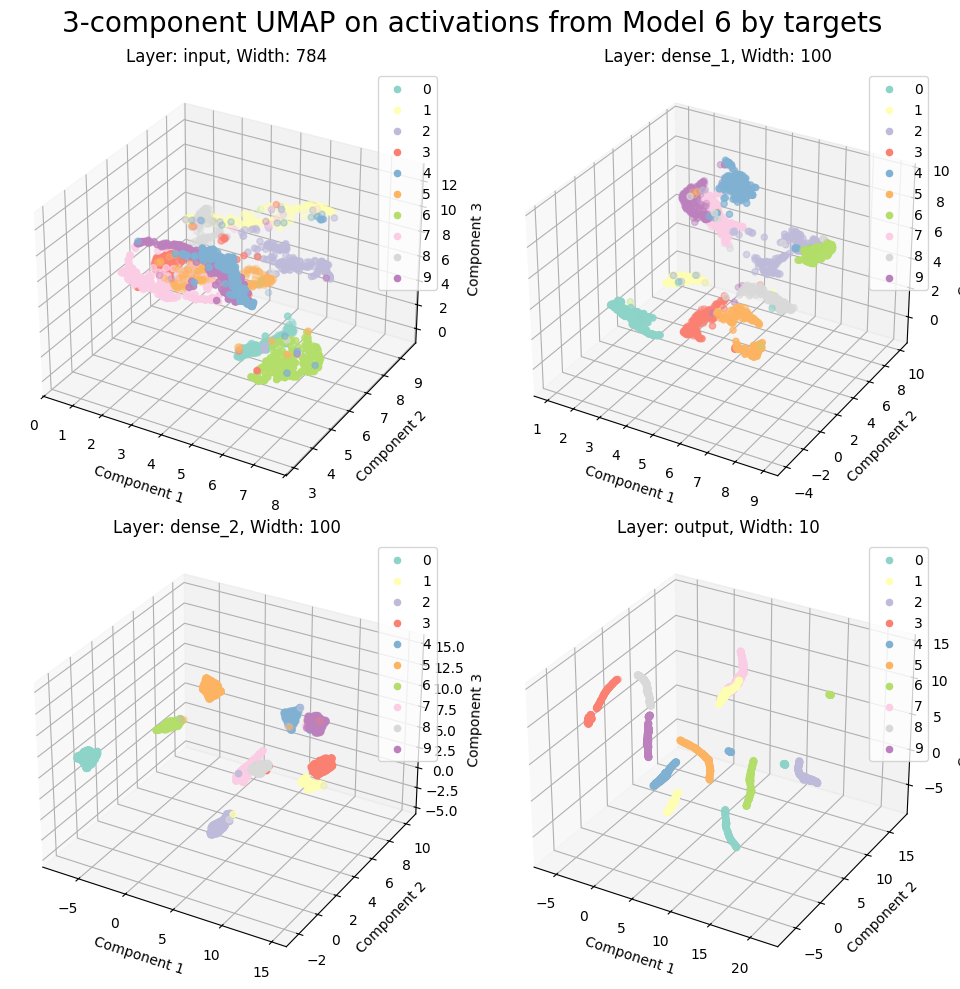

In [76]:
outputs=[]
titles=[]

for i in range(len(model6.layers)):
    output= perform_umap(data6, layer=i, n_components=3)
    outputs.append(output)
    titles.append(f'Layer: {layers_names6[i]}, Width: {layers_widthes6[i]}')

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 6 by {by}',
           titles=titles, by=by, d=3,
           rows=2, cols=2)

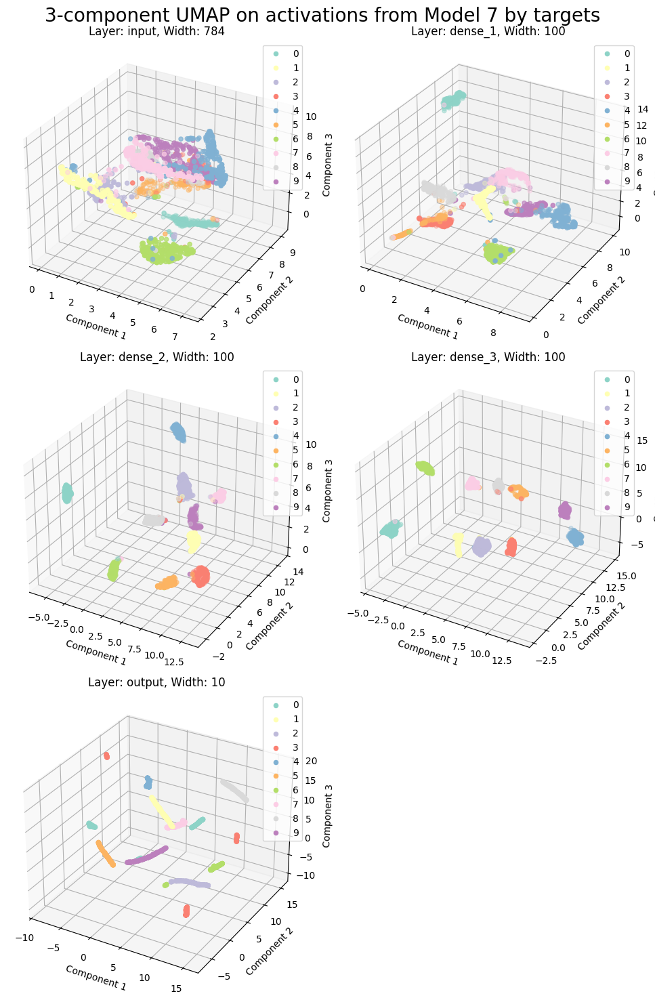

In [77]:
outputs=[]
titles=[]

for i in range(len(model7.layers)):
    output= perform_umap(data7, layer=i, n_components=3)
    outputs.append(output)
    titles.append(f'Layer: {layers_names7[i]}, Width: {layers_widthes7[i]}')

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 7 by {by}',
           titles=titles, by=by, d=3,
           rows=3, cols=2)

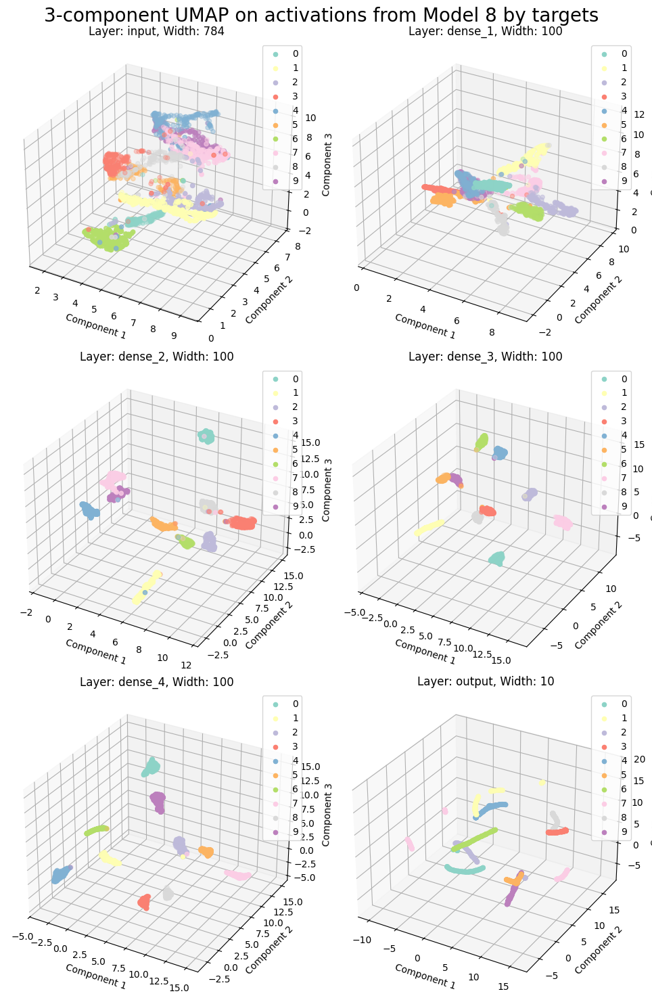

In [78]:
outputs=[]
titles=[]

for i in range(len(model8.layers)):
    output= perform_umap(data8, layer=i, n_components=3)
    outputs.append(output)
    titles.append(f'Layer: {layers_names8[i]}, Width: {layers_widthes8[i]}')

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 8 by {by}',
           titles=titles, by=by, d=3,
           rows=3, cols=2)

## Plot wrong predictions on low-dimensional plots

In [89]:
def plot_misses(data_list, global_title, titles, rows, cols,  xlim=None, ylim=None, zlim=None, digits=False):
    
    fig = plt.figure(figsize=(5 * cols, 5 * rows))
    axs = []
    for i in range(1, rows * cols + 1):
        ax = fig.add_subplot(rows, cols, i, projection='3d')
        axs.append(ax)

    for ax, data, title in zip(axs, data_list, titles):
        df=pd.DataFrame(data)
    
        ax.set_xlabel('Component 1')
        ax.set_ylabel('Component 2')
        ax.set_zlabel('Component 3')
        ax.set_title(title)

        
        x_min, x_max = data['component 1'].min(), data['component 1'].max()
        y_min, y_max = data['component 2'].min(), data['component 2'].max()
        z_min, z_max = data['component 3'].min(), data['component 3'].max()
        
        if xlim==None:
            x_margin = (x_max - x_min) * 0.1
            ax.set_xlim(x_min - x_margin, x_max + x_margin)
        else:
            ax.set_xlim(xlim)
    
        if ylim==None:
            y_margin = (y_max - y_min) * 0.1
            ax.set_ylim(y_min - y_margin, y_max + y_margin)
        else: 
            ax.set_ylim(ylim)
    
        if zlim==None:
            z_margin = (z_max - z_min) * 0.1
            ax.set_zlim(z_min - z_margin, z_max + z_margin)
        else:
            ax.set_zlim(zlim)
        ax.scatter(df.loc[~df['match'], 'component 1'], 
                   df.loc[~df['match'], 'component 2'], 
                   df.loc[~df['match'], 'component 3'], 
                   color='red')    
    
    for ax in axs[len(data_list):]:
            ax.set_visible(False)

    fig.suptitle(global_title, fontsize=20)
    plt.tight_layout()
    plt.show()

Epoch 1/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8795 - loss: 0.4102 - val_accuracy: 0.9672 - val_loss: 0.1116
Epoch 2/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9702 - loss: 0.0963 - val_accuracy: 0.9701 - val_loss: 0.0990
Epoch 3/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9811 - loss: 0.0601 - val_accuracy: 0.9731 - val_loss: 0.0895
Epoch 4/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9872 - loss: 0.0414 - val_accuracy: 0.9776 - val_loss: 0.0798
Epoch 5/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9895 - loss: 0.0315 - val_accuracy: 0.9762 - val_loss: 0.0932
Epoch 6/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9918 - loss: 0.0247 - val_accuracy: 0.9745 - val_loss: 0.1014
Epoch 7/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9930 - loss: 0.0207 - val_accuracy: 0.9771 - val_loss: 0.0963
Epoch 8/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9942 - loss: 0

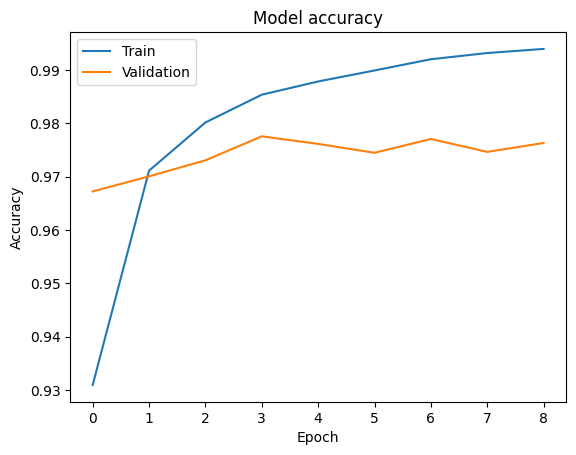

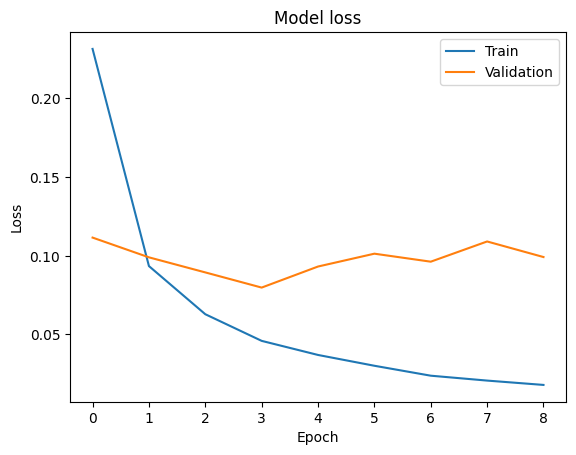

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 513us/step - accuracy: 0.9765 - loss: 0.0843


In [79]:
train_mlp(widthes=[256, 128], model_name='Model_9')
model9, layers_names9, layers_widthes9, test_loss9, test_acc9 =  get_mlp('Model_9')

In [80]:
data9 = get_activations(model9, x_subset, y_subset)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 537us/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 603us/step


In [81]:
outputs=[]
explained_variances=[]
titles=[]

for i in range(len(model9.layers)):
    output, explained_variance= perform_pca(data=data9, layer=i, n_components=3)
    outputs.append(output)
    explained_variances.append(explained_variance)
    titles.append(f'Layer: {layers_names9[i]}, Width: {layers_widthes9[i]}')

In [82]:
xlim = ylim = zlim = None

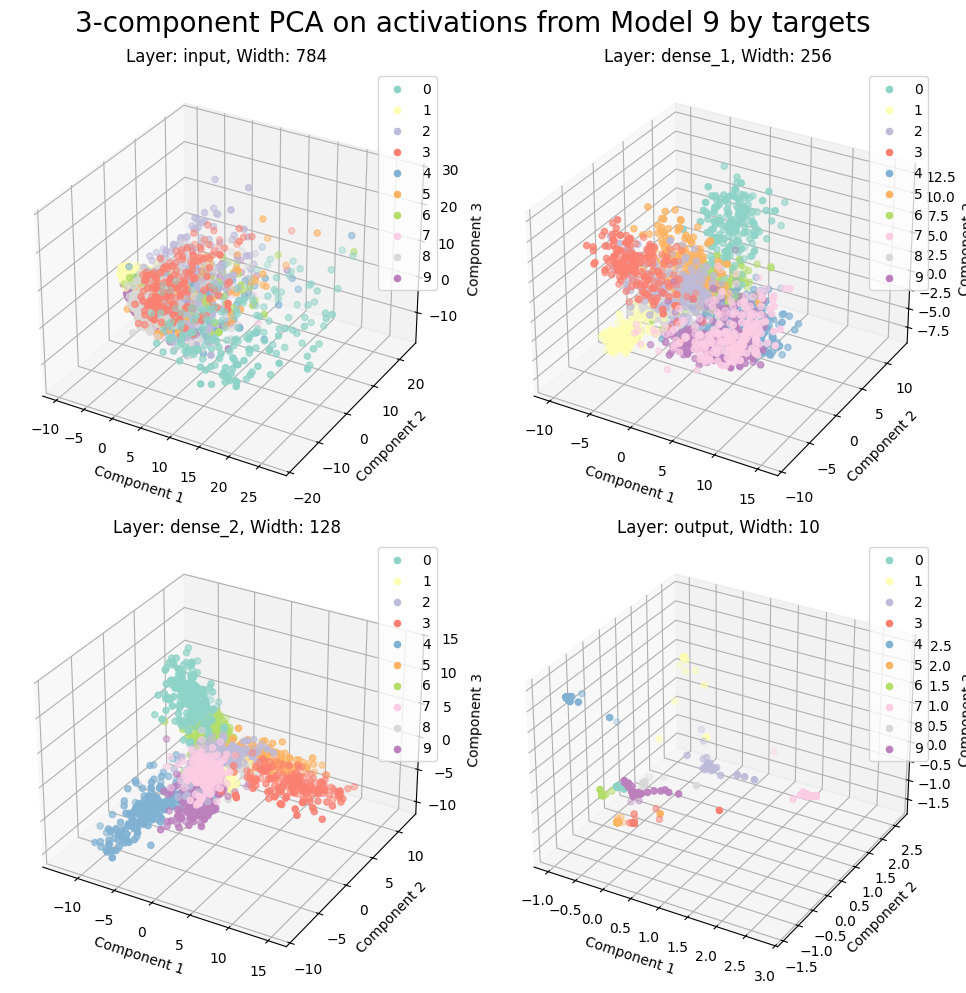

In [83]:
by='targets'

plot_panel(data_list=outputs,
           global_title=f'3-component PCA on activations from Model 9 by {by}',
           xlim=xlim, ylim=ylim, zlim=zlim,
           titles=titles, by=by, d=3,
           rows=2, cols=2)

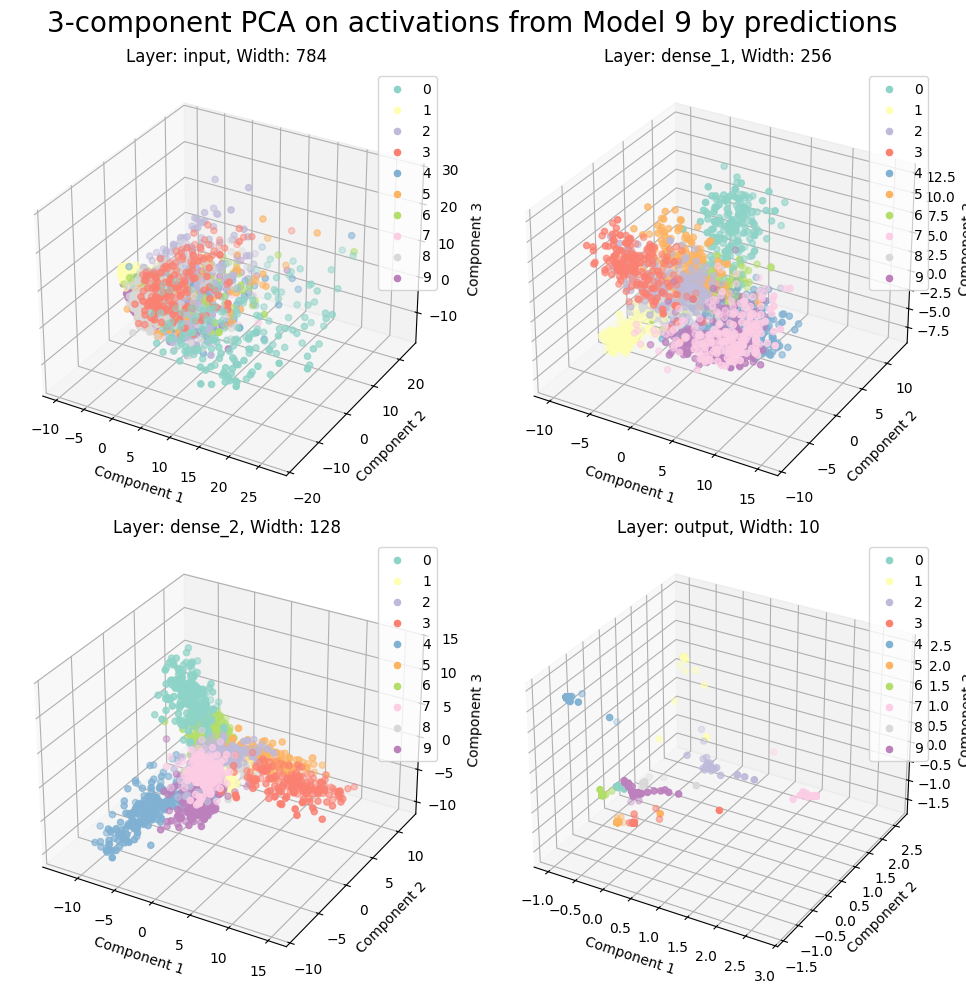

In [84]:
by='predictions'

plot_panel(data_list=outputs,
           global_title=f'3-component PCA on activations from Model 9 by {by}',
           xlim=xlim, ylim=ylim, zlim=zlim,
           titles=titles, by=by, d=3,
           rows=2, cols=2)

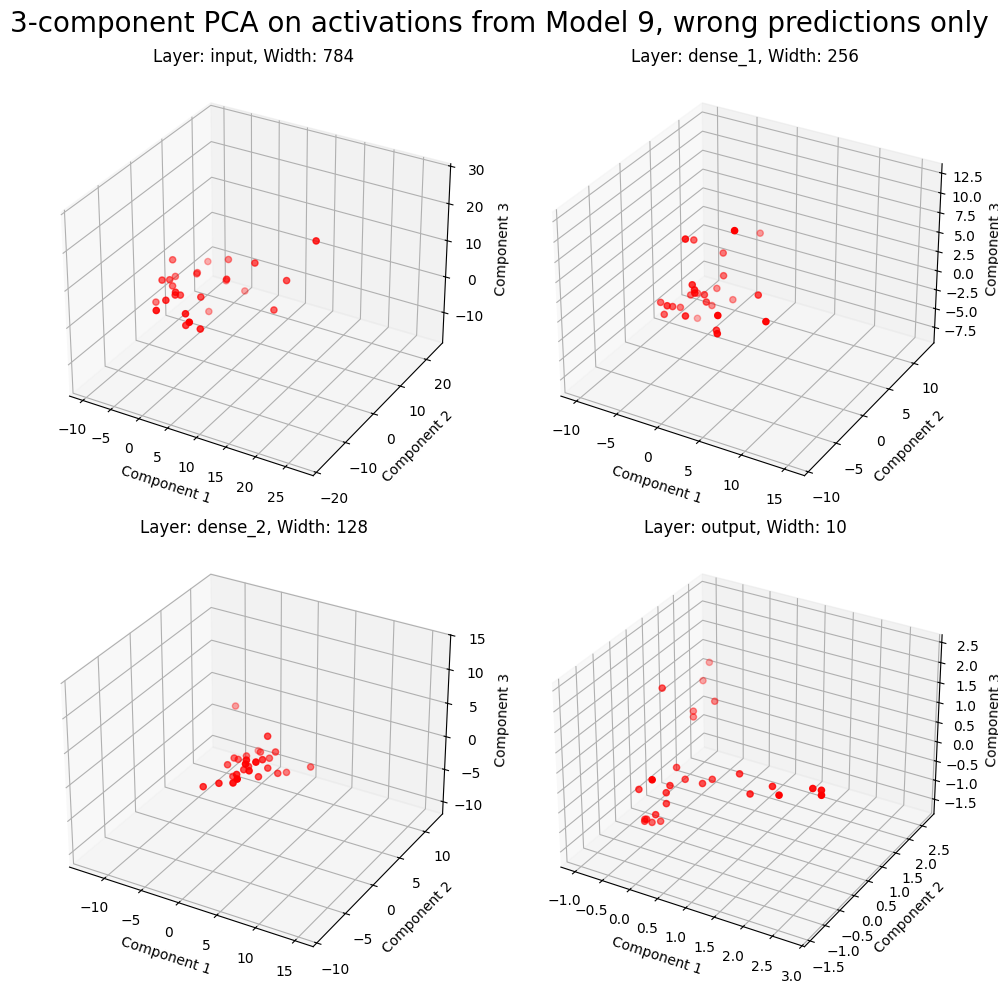

In [91]:
plot_misses(data_list=outputs,
            global_title=f'3-component PCA on activations from Model 9, wrong predictions only',
            xlim=xlim, ylim=ylim, zlim=zlim,
            titles=titles,
            rows=2, cols=2, digits=False)

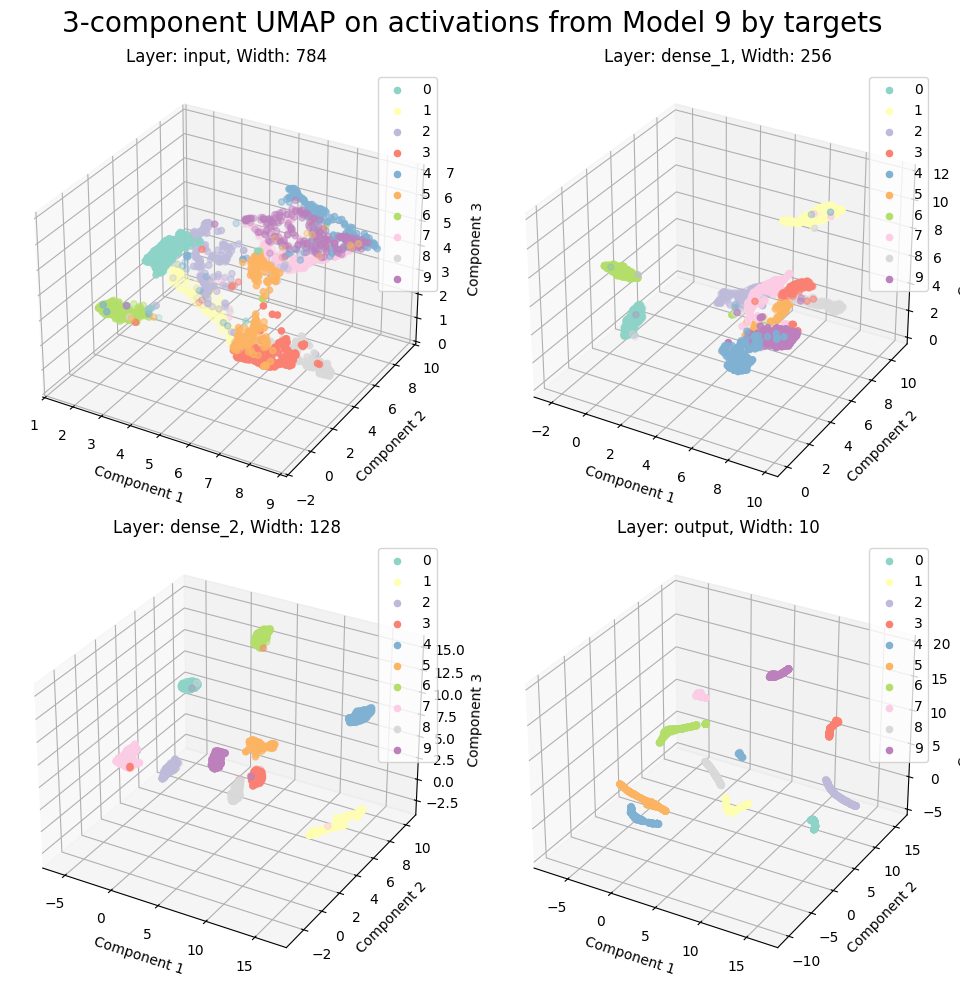

In [94]:

by='targets'

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 9 by {by}',
           titles=titles, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

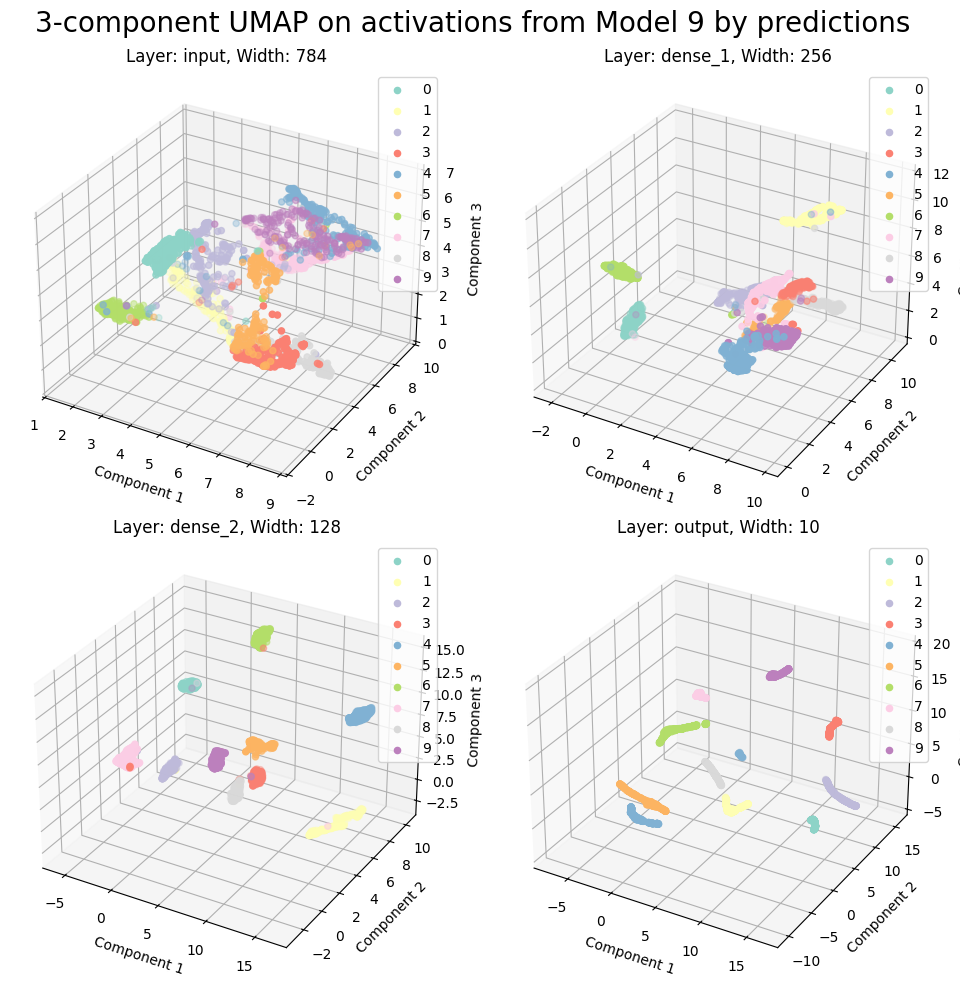

In [95]:
by='predictions'

plot_panel(data_list=outputs,
           global_title=f'3-component UMAP on activations from Model 9 by {by}',
           xlim=xlim, ylim=ylim, zlim=zlim,
           titles=titles, by=by, d=3,
           rows=2, cols=2)

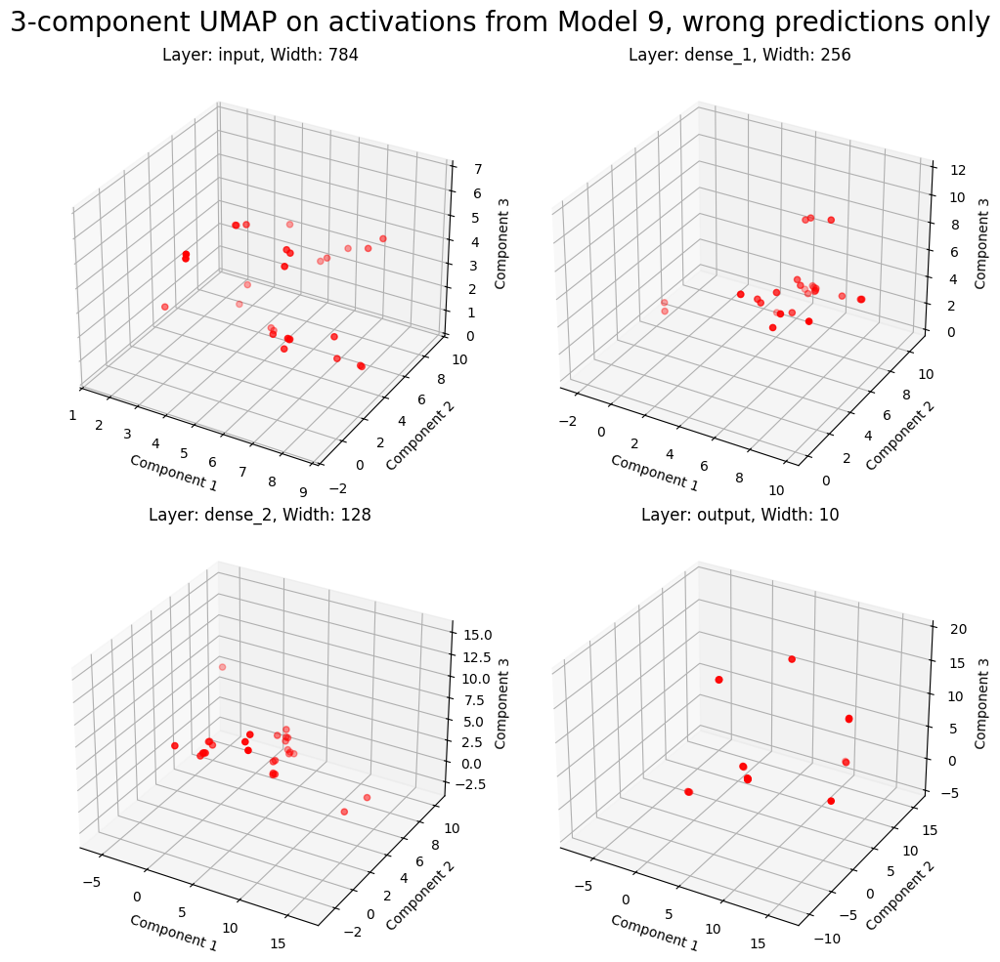

In [96]:
plot_misses(data_list=outputs,
            global_title=f'3-component UMAP on activations from Model 9, wrong predictions only',
            titles=titles,
            xlim=xlim, ylim=ylim, zlim=zlim,
            rows=2, cols=2, digits=False)

In [97]:
outputs=[]
explained_variances=[]
titles=[]

for i in range(len(model9.layers)):
    output= perform_tsne(data=data9, layer=i, n_components=3)
    outputs.append(output)
    titles.append(f'Layer: {layers_names9[i]}, Width: {layers_widthes9[i]}')


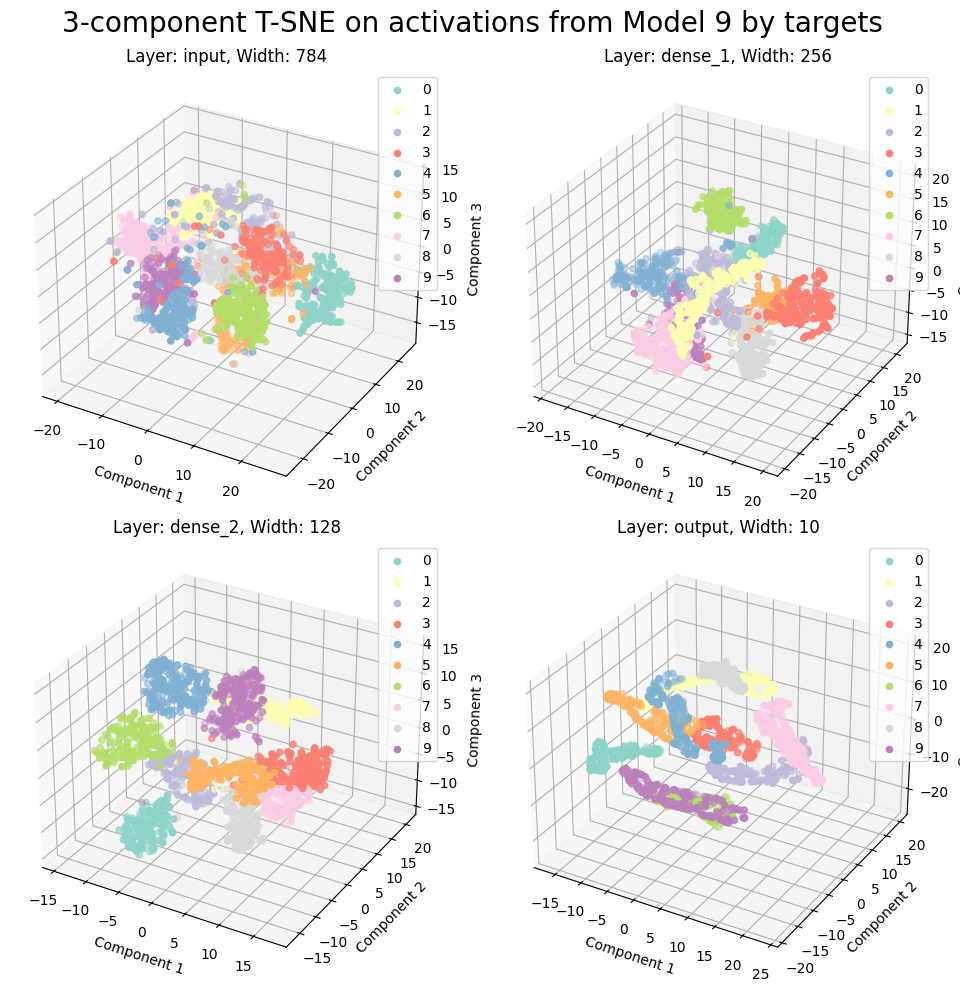

In [98]:
by='targets'

plot_panel(data_list=outputs,
           global_title=f'3-component T-SNE on activations from Model 9 by {by}',
           titles=titles, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

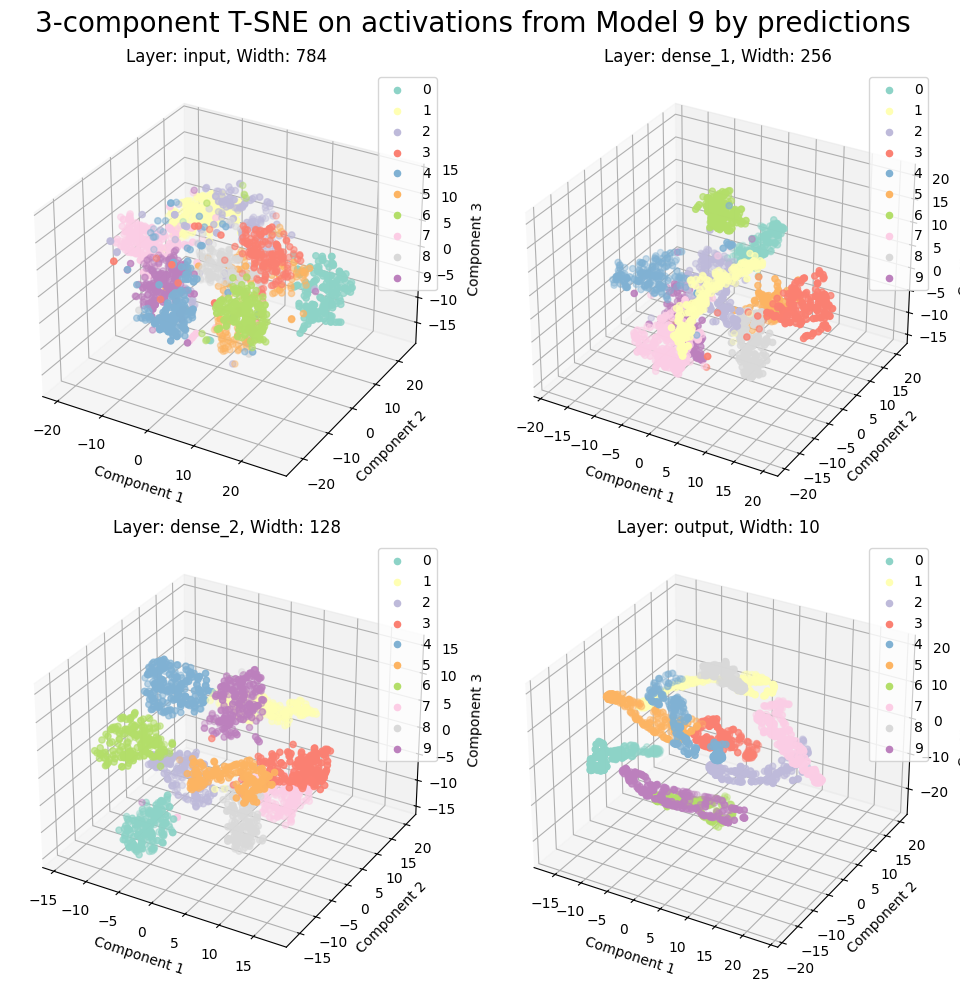

In [99]:
by='predictions'

plot_panel(data_list=outputs,
           global_title=f'3-component T-SNE on activations from Model 9 by {by}',
           titles=titles, by=by, d=3,
           xlim=xlim, ylim=ylim, zlim=zlim,
           rows=2, cols=2)

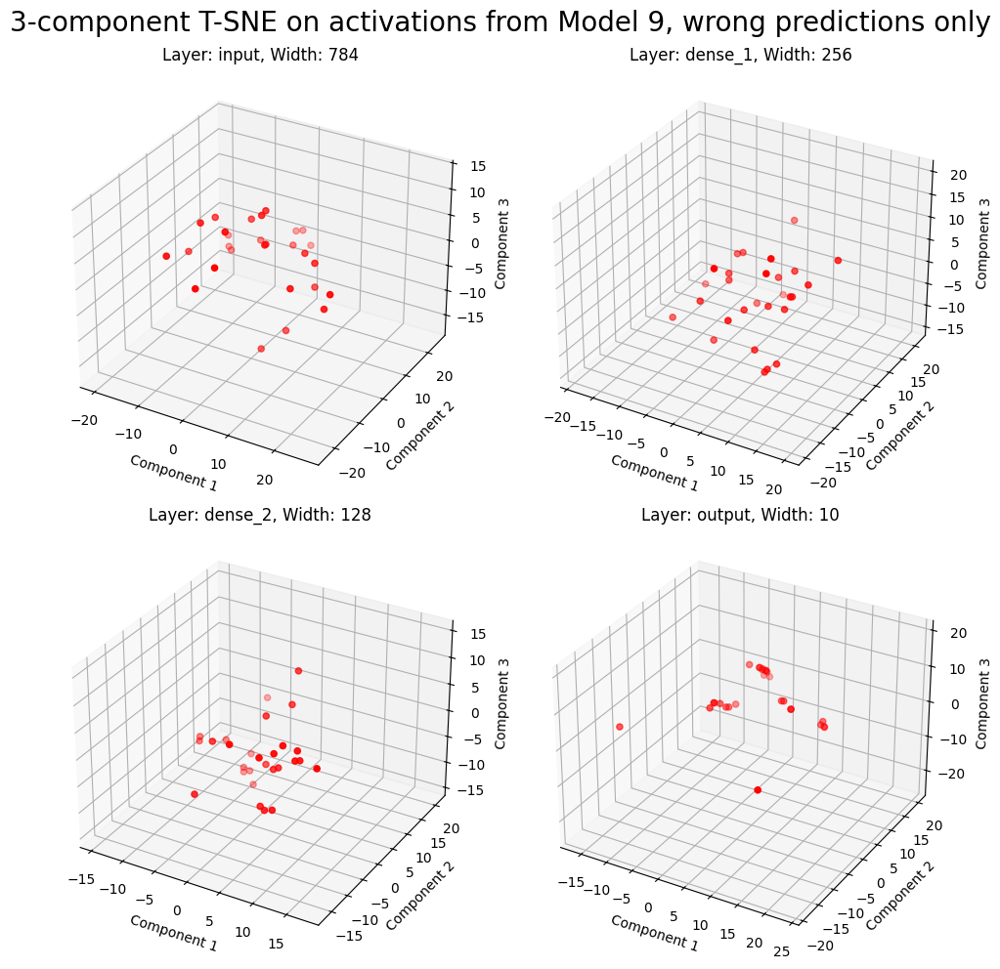

In [102]:
plot_misses(data_list=outputs,
            global_title=f'3-component T-SNE on activations from Model 9, wrong predictions only',
            titles=titles,
            xlim=xlim, ylim=ylim, zlim=zlim,
            rows=2, cols=2, digits=False)



## Questions

How to interpret PCA plots?

Do we want the same axis limits for low dimensional plots of different layers?

What qualitative measures can we chose from the low-dimensional plots?

What is difference between T-SNE and UMAP?

Why does UMAP produce different low-dimensional represnetations on different runs (with the same data, perplexity, etc)?

Why is explained variance in components from the output layer is so nicely distributed? (always around 10-11 percent)

Why is data gets more like a line with higher number of units in PCA?

Why does in UMAP data looks like clusters in intermediate layers and as lines in the output layer?

How to interpret UMAP plots? Should I look at clusters? Spaces between clusters? How ‘tight’ the points are within clusters?

Are miss-match points somehow different? Do they line on the ‘outskirts’ of clusters? Or how to they even look? Maybe they are confusing for humans too? answer